In [ ]:
#import dependencies
# code from https://github.com/ashinbabu/GAN_MNIST/tree/main

import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

In [2]:
# Define hyperparameters
num_epochs = 100
batch_size = 64
learning_rate = 0.0002
image_size = 28
image_channels = 1
latent_dim = 100

In [ ]:
# Create a custom dataset for MNIST
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

mnist_dataset = datasets.MNIST(root='./data',
                               train=True,
                               transform=transform,
                               download=True)

data_loader = DataLoader(dataset=mnist_dataset,
                         batch_size=batch_size,
                         shuffle=True)

In [ ]:
# Define the generator network
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 256, 7, 1, 0),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, image_channels, 4, 2, 1),
            nn.Tanh()
        )

    def forward(self, z):
        return self.model(z)

In [ ]:
# Define the discriminator network
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(image_channels, 128, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, 7, 1, 0),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x)

In [ ]:
# Initialize the generator and discriminator
generator = Generator().cuda()
discriminator = Discriminator().cuda()

In [ ]:
# Define loss and optimizers
criterion = nn.BCELoss()
optimizer_g = torch.optim.Adam(generator.parameters(), lr=learning_rate)
optimizer_d = torch.optim.Adam(discriminator.parameters(), lr=learning_rate)

Epoch [1/100], Batch [100/938], D_real: 0.9544, D_fake: 0.2422, Loss_D: 0.4330, Loss_G: 2.1928
Epoch [1/100], Batch [200/938], D_real: 0.9931, D_fake: 0.3425, Loss_D: 0.5996, Loss_G: 1.6844
Epoch [1/100], Batch [300/938], D_real: 0.8851, D_fake: 0.0747, Loss_D: 0.2241, Loss_G: 4.1636
Epoch [1/100], Batch [400/938], D_real: 0.9426, D_fake: 0.1257, Loss_D: 0.2256, Loss_G: 4.0306
Epoch [1/100], Batch [500/938], D_real: 0.8013, D_fake: 0.1489, Loss_D: 0.4710, Loss_G: 3.2624
Epoch [1/100], Batch [600/938], D_real: 0.7734, D_fake: 0.0399, Loss_D: 0.3893, Loss_G: 3.3635
Epoch [1/100], Batch [700/938], D_real: 0.7839, D_fake: 0.0320, Loss_D: 0.3791, Loss_G: 3.6354
Epoch [1/100], Batch [800/938], D_real: 0.9098, D_fake: 0.1176, Loss_D: 0.2783, Loss_G: 2.4525
Epoch [1/100], Batch [900/938], D_real: 0.8565, D_fake: 0.0684, Loss_D: 0.2645, Loss_G: 4.2728


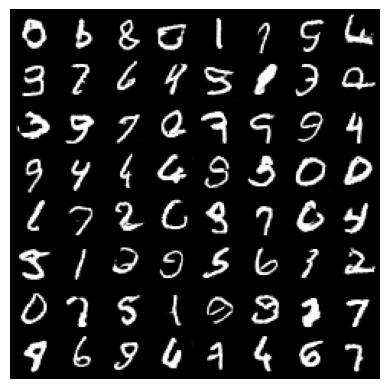

Epoch [2/100], Batch [100/938], D_real: 0.8539, D_fake: 0.0672, Loss_D: 0.2653, Loss_G: 4.3591
Epoch [2/100], Batch [200/938], D_real: 0.9536, D_fake: 0.0823, Loss_D: 0.1524, Loss_G: 3.9917
Epoch [2/100], Batch [300/938], D_real: 0.8152, D_fake: 0.0494, Loss_D: 0.3004, Loss_G: 3.5034
Epoch [2/100], Batch [400/938], D_real: 0.9271, D_fake: 0.0797, Loss_D: 0.1766, Loss_G: 4.1962
Epoch [2/100], Batch [500/938], D_real: 0.9089, D_fake: 0.0962, Loss_D: 0.2399, Loss_G: 3.2642
Epoch [2/100], Batch [600/938], D_real: 0.9677, D_fake: 0.0985, Loss_D: 0.1576, Loss_G: 3.9743
Epoch [2/100], Batch [700/938], D_real: 0.9408, D_fake: 0.1986, Loss_D: 0.3501, Loss_G: 4.6248
Epoch [2/100], Batch [800/938], D_real: 0.9970, D_fake: 0.1674, Loss_D: 0.2202, Loss_G: 2.2955
Epoch [2/100], Batch [900/938], D_real: 0.9710, D_fake: 0.1202, Loss_D: 0.2137, Loss_G: 3.5343


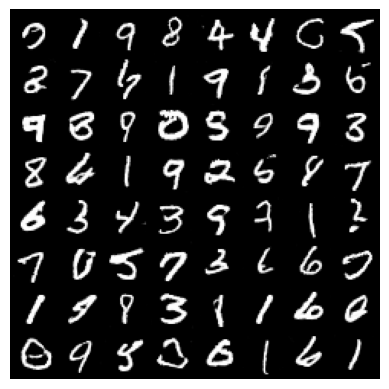

Epoch [3/100], Batch [100/938], D_real: 0.9401, D_fake: 0.0744, Loss_D: 0.1546, Loss_G: 3.5361
Epoch [3/100], Batch [200/938], D_real: 0.9663, D_fake: 0.3387, Loss_D: 0.6091, Loss_G: 2.5506
Epoch [3/100], Batch [300/938], D_real: 0.8944, D_fake: 0.0503, Loss_D: 0.1799, Loss_G: 4.3187
Epoch [3/100], Batch [400/938], D_real: 0.8993, D_fake: 0.0582, Loss_D: 0.1897, Loss_G: 3.6488
Epoch [3/100], Batch [500/938], D_real: 0.8541, D_fake: 0.2431, Loss_D: 0.5767, Loss_G: 2.9632
Epoch [3/100], Batch [600/938], D_real: 0.9920, D_fake: 0.2639, Loss_D: 0.4238, Loss_G: 3.1728
Epoch [3/100], Batch [700/938], D_real: 0.9642, D_fake: 0.0521, Loss_D: 0.1078, Loss_G: 4.2697
Epoch [3/100], Batch [800/938], D_real: 0.8707, D_fake: 0.1424, Loss_D: 0.4686, Loss_G: 2.6615
Epoch [3/100], Batch [900/938], D_real: 0.9594, D_fake: 0.1492, Loss_D: 0.2519, Loss_G: 2.5547


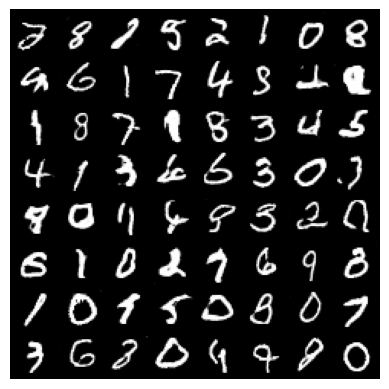

Epoch [4/100], Batch [100/938], D_real: 0.8895, D_fake: 0.1080, Loss_D: 0.2688, Loss_G: 4.1193
Epoch [4/100], Batch [200/938], D_real: 0.8897, D_fake: 0.0686, Loss_D: 0.2234, Loss_G: 3.7891
Epoch [4/100], Batch [300/938], D_real: 0.9675, D_fake: 0.0903, Loss_D: 0.1448, Loss_G: 4.5182
Epoch [4/100], Batch [400/938], D_real: 0.9175, D_fake: 0.0859, Loss_D: 0.2065, Loss_G: 4.6744
Epoch [4/100], Batch [500/938], D_real: 0.9174, D_fake: 0.1321, Loss_D: 0.2726, Loss_G: 2.7895
Epoch [4/100], Batch [600/938], D_real: 0.8430, D_fake: 0.0645, Loss_D: 0.2947, Loss_G: 3.7796
Epoch [4/100], Batch [700/938], D_real: 0.9037, D_fake: 0.1167, Loss_D: 0.2808, Loss_G: 2.2701
Epoch [4/100], Batch [800/938], D_real: 0.9644, D_fake: 0.0792, Loss_D: 0.1349, Loss_G: 4.2590
Epoch [4/100], Batch [900/938], D_real: 0.8156, D_fake: 0.0317, Loss_D: 0.2694, Loss_G: 5.2028


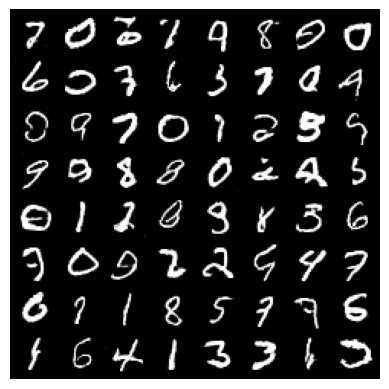

Epoch [5/100], Batch [100/938], D_real: 0.9491, D_fake: 0.0777, Loss_D: 0.1544, Loss_G: 3.6856
Epoch [5/100], Batch [200/938], D_real: 0.8825, D_fake: 0.0239, Loss_D: 0.1784, Loss_G: 4.1091
Epoch [5/100], Batch [300/938], D_real: 0.9480, D_fake: 0.0386, Loss_D: 0.1004, Loss_G: 4.8478
Epoch [5/100], Batch [400/938], D_real: 0.7709, D_fake: 0.0722, Loss_D: 0.3795, Loss_G: 3.4601
Epoch [5/100], Batch [500/938], D_real: 0.9530, D_fake: 0.1179, Loss_D: 0.2005, Loss_G: 3.1938
Epoch [5/100], Batch [600/938], D_real: 0.8739, D_fake: 0.0652, Loss_D: 0.2229, Loss_G: 4.1842
Epoch [5/100], Batch [700/938], D_real: 0.9022, D_fake: 0.1202, Loss_D: 0.3333, Loss_G: 3.6294
Epoch [5/100], Batch [800/938], D_real: 0.9642, D_fake: 0.2161, Loss_D: 0.3719, Loss_G: 2.6397
Epoch [5/100], Batch [900/938], D_real: 0.9392, D_fake: 0.2792, Loss_D: 0.5824, Loss_G: 4.6909


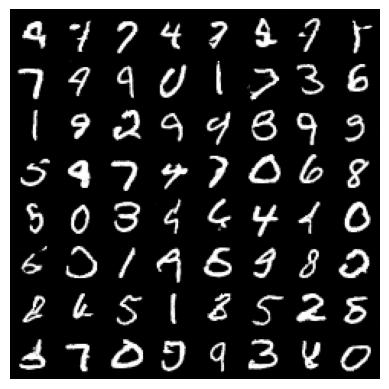

Epoch [6/100], Batch [100/938], D_real: 0.9338, D_fake: 0.0885, Loss_D: 0.2057, Loss_G: 3.5791
Epoch [6/100], Batch [200/938], D_real: 0.9381, D_fake: 0.2873, Loss_D: 0.6044, Loss_G: 2.6458
Epoch [6/100], Batch [300/938], D_real: 0.8932, D_fake: 0.1755, Loss_D: 0.3811, Loss_G: 3.4267
Epoch [6/100], Batch [400/938], D_real: 0.9533, D_fake: 0.1954, Loss_D: 0.3327, Loss_G: 2.6644
Epoch [6/100], Batch [500/938], D_real: 0.9887, D_fake: 0.1770, Loss_D: 0.2601, Loss_G: 3.1874
Epoch [6/100], Batch [600/938], D_real: 0.9739, D_fake: 0.2297, Loss_D: 0.3584, Loss_G: 3.2095
Epoch [6/100], Batch [700/938], D_real: 0.9102, D_fake: 0.1803, Loss_D: 0.3568, Loss_G: 1.8331
Epoch [6/100], Batch [800/938], D_real: 0.9505, D_fake: 0.1568, Loss_D: 0.2639, Loss_G: 3.0267
Epoch [6/100], Batch [900/938], D_real: 0.8565, D_fake: 0.0345, Loss_D: 0.2155, Loss_G: 4.4976


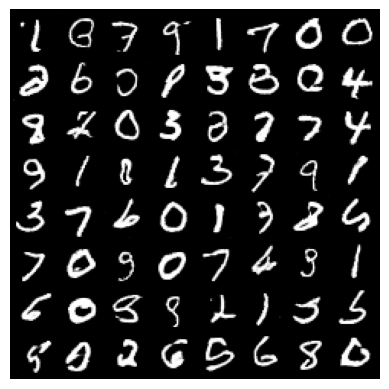

Epoch [7/100], Batch [100/938], D_real: 0.9305, D_fake: 0.0890, Loss_D: 0.1888, Loss_G: 3.7785
Epoch [7/100], Batch [200/938], D_real: 0.9728, D_fake: 0.1188, Loss_D: 0.1787, Loss_G: 2.7015
Epoch [7/100], Batch [300/938], D_real: 0.8979, D_fake: 0.0439, Loss_D: 0.1745, Loss_G: 3.6414
Epoch [7/100], Batch [400/938], D_real: 0.9301, D_fake: 0.0945, Loss_D: 0.2004, Loss_G: 3.1427
Epoch [7/100], Batch [500/938], D_real: 0.9513, D_fake: 0.0577, Loss_D: 0.1421, Loss_G: 3.6710
Epoch [7/100], Batch [600/938], D_real: 0.8666, D_fake: 0.0836, Loss_D: 0.2722, Loss_G: 4.1843
Epoch [7/100], Batch [700/938], D_real: 0.9555, D_fake: 0.2220, Loss_D: 0.4128, Loss_G: 4.1764
Epoch [7/100], Batch [800/938], D_real: 0.8393, D_fake: 0.0412, Loss_D: 0.2580, Loss_G: 4.4985
Epoch [7/100], Batch [900/938], D_real: 0.9495, D_fake: 0.1582, Loss_D: 0.2739, Loss_G: 3.9476


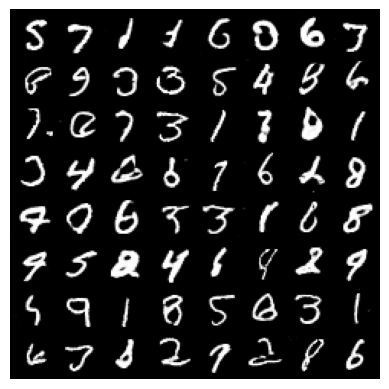

Epoch [8/100], Batch [100/938], D_real: 0.9822, D_fake: 0.0904, Loss_D: 0.1238, Loss_G: 3.1519
Epoch [8/100], Batch [200/938], D_real: 0.7365, D_fake: 0.0038, Loss_D: 0.4287, Loss_G: 6.0784
Epoch [8/100], Batch [300/938], D_real: 0.8999, D_fake: 0.1566, Loss_D: 0.3629, Loss_G: 3.2519
Epoch [8/100], Batch [400/938], D_real: 0.9648, D_fake: 0.3696, Loss_D: 0.7314, Loss_G: 2.3576
Epoch [8/100], Batch [500/938], D_real: 0.9158, D_fake: 0.0327, Loss_D: 0.1408, Loss_G: 4.1469
Epoch [8/100], Batch [600/938], D_real: 0.9690, D_fake: 0.1701, Loss_D: 0.2519, Loss_G: 2.6889
Epoch [8/100], Batch [700/938], D_real: 0.5858, D_fake: 0.0160, Loss_D: 0.6907, Loss_G: 4.4227
Epoch [8/100], Batch [800/938], D_real: 0.8972, D_fake: 0.1655, Loss_D: 0.3787, Loss_G: 4.0435
Epoch [8/100], Batch [900/938], D_real: 0.6384, D_fake: 0.0234, Loss_D: 0.6523, Loss_G: 3.1849


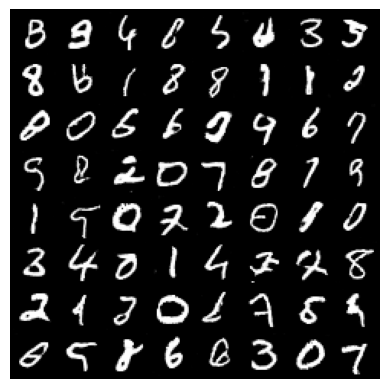

Epoch [9/100], Batch [100/938], D_real: 0.9816, D_fake: 0.1237, Loss_D: 0.1745, Loss_G: 2.4692
Epoch [9/100], Batch [200/938], D_real: 0.9686, D_fake: 0.1199, Loss_D: 0.1851, Loss_G: 4.2519
Epoch [9/100], Batch [300/938], D_real: 0.8747, D_fake: 0.0411, Loss_D: 0.2098, Loss_G: 6.3482
Epoch [9/100], Batch [400/938], D_real: 0.9729, D_fake: 0.0780, Loss_D: 0.1324, Loss_G: 3.7480
Epoch [9/100], Batch [500/938], D_real: 0.9034, D_fake: 0.1092, Loss_D: 0.2531, Loss_G: 2.7156
Epoch [9/100], Batch [600/938], D_real: 0.7928, D_fake: 0.0619, Loss_D: 0.3599, Loss_G: 3.4846
Epoch [9/100], Batch [700/938], D_real: 0.9450, D_fake: 0.0553, Loss_D: 0.1236, Loss_G: 3.9675
Epoch [9/100], Batch [800/938], D_real: 0.6473, D_fake: 0.0082, Loss_D: 0.6224, Loss_G: 5.2946
Epoch [9/100], Batch [900/938], D_real: 0.9275, D_fake: 0.1201, Loss_D: 0.2624, Loss_G: 4.6043


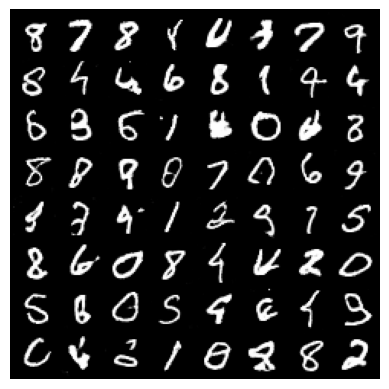

Epoch [10/100], Batch [100/938], D_real: 0.6536, D_fake: 0.0107, Loss_D: 0.5738, Loss_G: 4.7719
Epoch [10/100], Batch [200/938], D_real: 0.9940, D_fake: 0.4461, Loss_D: 0.9147, Loss_G: 2.2959
Epoch [10/100], Batch [300/938], D_real: 0.8779, D_fake: 0.0316, Loss_D: 0.1881, Loss_G: 4.2753
Epoch [10/100], Batch [400/938], D_real: 0.9103, D_fake: 0.0867, Loss_D: 0.2674, Loss_G: 4.0374
Epoch [10/100], Batch [500/938], D_real: 0.7909, D_fake: 0.0037, Loss_D: 0.2877, Loss_G: 7.0377
Epoch [10/100], Batch [600/938], D_real: 0.9030, D_fake: 0.1158, Loss_D: 0.2663, Loss_G: 3.0337
Epoch [10/100], Batch [700/938], D_real: 0.9043, D_fake: 0.1280, Loss_D: 0.2865, Loss_G: 3.4297
Epoch [10/100], Batch [800/938], D_real: 0.9826, D_fake: 0.2180, Loss_D: 0.3744, Loss_G: 3.3253
Epoch [10/100], Batch [900/938], D_real: 0.9184, D_fake: 0.0810, Loss_D: 0.2145, Loss_G: 4.4196


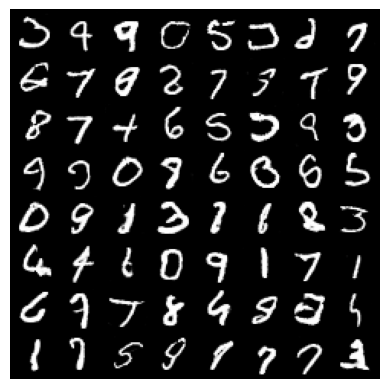

Epoch [11/100], Batch [100/938], D_real: 0.9920, D_fake: 0.3597, Loss_D: 0.6242, Loss_G: 2.7784
Epoch [11/100], Batch [200/938], D_real: 0.9216, D_fake: 0.1180, Loss_D: 0.2468, Loss_G: 2.4236
Epoch [11/100], Batch [300/938], D_real: 0.8119, D_fake: 0.0352, Loss_D: 0.2923, Loss_G: 4.6244
Epoch [11/100], Batch [400/938], D_real: 0.9321, D_fake: 0.0433, Loss_D: 0.1226, Loss_G: 5.2836
Epoch [11/100], Batch [500/938], D_real: 0.7923, D_fake: 0.0321, Loss_D: 0.3379, Loss_G: 4.8773
Epoch [11/100], Batch [600/938], D_real: 0.9437, D_fake: 0.0599, Loss_D: 0.1301, Loss_G: 3.9597
Epoch [11/100], Batch [700/938], D_real: 0.8814, D_fake: 0.1308, Loss_D: 0.3200, Loss_G: 4.2624
Epoch [11/100], Batch [800/938], D_real: 0.8531, D_fake: 0.0437, Loss_D: 0.2333, Loss_G: 3.4514
Epoch [11/100], Batch [900/938], D_real: 0.8900, D_fake: 0.1094, Loss_D: 0.2623, Loss_G: 3.4278


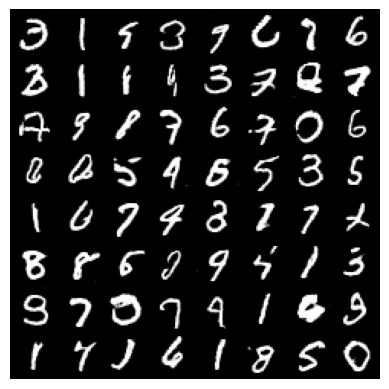

Epoch [12/100], Batch [100/938], D_real: 0.9550, D_fake: 0.0573, Loss_D: 0.1190, Loss_G: 4.8900
Epoch [12/100], Batch [200/938], D_real: 0.7748, D_fake: 0.0631, Loss_D: 0.3815, Loss_G: 4.3160
Epoch [12/100], Batch [300/938], D_real: 0.9761, D_fake: 0.1429, Loss_D: 0.2078, Loss_G: 3.6338
Epoch [12/100], Batch [400/938], D_real: 0.9210, D_fake: 0.1250, Loss_D: 0.2580, Loss_G: 2.3378
Epoch [12/100], Batch [500/938], D_real: 0.8844, D_fake: 0.0719, Loss_D: 0.2491, Loss_G: 4.1519
Epoch [12/100], Batch [600/938], D_real: 0.9449, D_fake: 0.0750, Loss_D: 0.1658, Loss_G: 3.7239
Epoch [12/100], Batch [700/938], D_real: 0.8287, D_fake: 0.0616, Loss_D: 0.2871, Loss_G: 3.9968
Epoch [12/100], Batch [800/938], D_real: 0.9626, D_fake: 0.1451, Loss_D: 0.2496, Loss_G: 3.9375
Epoch [12/100], Batch [900/938], D_real: 0.9940, D_fake: 0.3077, Loss_D: 0.5235, Loss_G: 2.3680


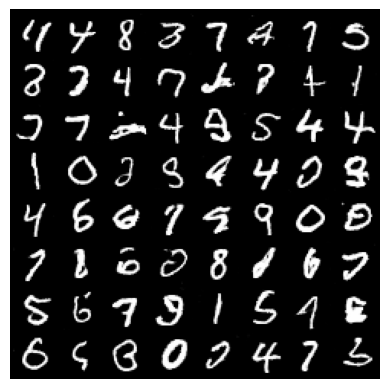

Epoch [13/100], Batch [100/938], D_real: 0.8356, D_fake: 0.0298, Loss_D: 0.2559, Loss_G: 3.5745
Epoch [13/100], Batch [200/938], D_real: 0.9549, D_fake: 0.2335, Loss_D: 0.4275, Loss_G: 2.4115
Epoch [13/100], Batch [300/938], D_real: 0.9731, D_fake: 0.1280, Loss_D: 0.1856, Loss_G: 4.6548
Epoch [13/100], Batch [400/938], D_real: 0.9855, D_fake: 0.0517, Loss_D: 0.0779, Loss_G: 4.9345
Epoch [13/100], Batch [500/938], D_real: 0.9840, D_fake: 0.1738, Loss_D: 0.2728, Loss_G: 2.8939
Epoch [13/100], Batch [600/938], D_real: 0.8045, D_fake: 0.0977, Loss_D: 0.4482, Loss_G: 2.7835
Epoch [13/100], Batch [700/938], D_real: 0.9248, D_fake: 0.0565, Loss_D: 0.1523, Loss_G: 4.4073
Epoch [13/100], Batch [800/938], D_real: 0.9368, D_fake: 0.1362, Loss_D: 0.2599, Loss_G: 5.3399
Epoch [13/100], Batch [900/938], D_real: 0.9692, D_fake: 0.1437, Loss_D: 0.2247, Loss_G: 3.2758


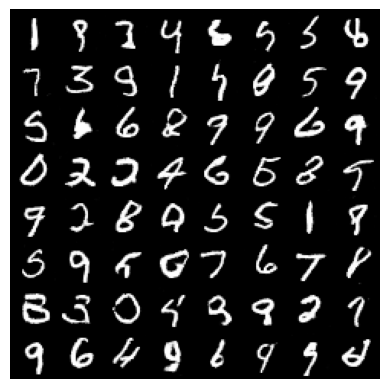

Epoch [14/100], Batch [100/938], D_real: 0.8288, D_fake: 0.0284, Loss_D: 0.2492, Loss_G: 5.5531
Epoch [14/100], Batch [200/938], D_real: 0.9220, D_fake: 0.1663, Loss_D: 0.3314, Loss_G: 4.6818
Epoch [14/100], Batch [300/938], D_real: 0.8845, D_fake: 0.0484, Loss_D: 0.1985, Loss_G: 4.2813
Epoch [14/100], Batch [400/938], D_real: 0.8460, D_fake: 0.0546, Loss_D: 0.2670, Loss_G: 5.0428
Epoch [14/100], Batch [500/938], D_real: 0.8521, D_fake: 0.0175, Loss_D: 0.2179, Loss_G: 4.8697
Epoch [14/100], Batch [600/938], D_real: 0.9278, D_fake: 0.1483, Loss_D: 0.3091, Loss_G: 3.5201
Epoch [14/100], Batch [700/938], D_real: 0.7433, D_fake: 0.0774, Loss_D: 0.5232, Loss_G: 3.5462
Epoch [14/100], Batch [800/938], D_real: 0.9598, D_fake: 0.1454, Loss_D: 0.2346, Loss_G: 3.8866
Epoch [14/100], Batch [900/938], D_real: 0.9295, D_fake: 0.0704, Loss_D: 0.1737, Loss_G: 4.6445


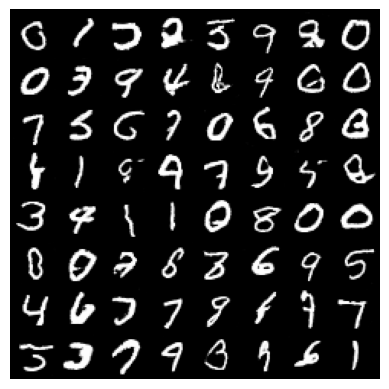

Epoch [15/100], Batch [100/938], D_real: 0.9568, D_fake: 0.0506, Loss_D: 0.1074, Loss_G: 5.3060
Epoch [15/100], Batch [200/938], D_real: 0.9110, D_fake: 0.0913, Loss_D: 0.2428, Loss_G: 3.5266
Epoch [15/100], Batch [300/938], D_real: 0.9296, D_fake: 0.0664, Loss_D: 0.1591, Loss_G: 4.4464
Epoch [15/100], Batch [400/938], D_real: 0.8099, D_fake: 0.0316, Loss_D: 0.2864, Loss_G: 3.8838
Epoch [15/100], Batch [500/938], D_real: 0.9014, D_fake: 0.0278, Loss_D: 0.1858, Loss_G: 3.5449
Epoch [15/100], Batch [600/938], D_real: 0.7115, D_fake: 0.0329, Loss_D: 0.4902, Loss_G: 3.1146
Epoch [15/100], Batch [700/938], D_real: 0.9620, D_fake: 0.1975, Loss_D: 0.3964, Loss_G: 2.8303
Epoch [15/100], Batch [800/938], D_real: 0.9471, D_fake: 0.1679, Loss_D: 0.3180, Loss_G: 3.1567
Epoch [15/100], Batch [900/938], D_real: 0.9710, D_fake: 0.3673, Loss_D: 0.7175, Loss_G: 3.5402


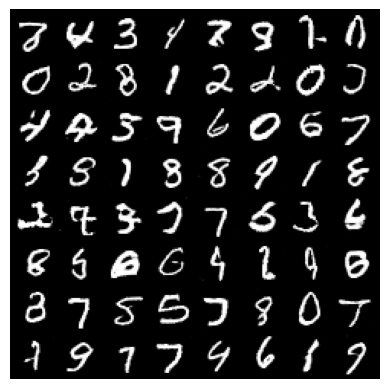

Epoch [16/100], Batch [100/938], D_real: 0.9620, D_fake: 0.1920, Loss_D: 0.2877, Loss_G: 3.1612
Epoch [16/100], Batch [200/938], D_real: 0.8680, D_fake: 0.1494, Loss_D: 0.3570, Loss_G: 3.4739
Epoch [16/100], Batch [300/938], D_real: 0.9066, D_fake: 0.0348, Loss_D: 0.1494, Loss_G: 6.0991
Epoch [16/100], Batch [400/938], D_real: 0.9346, D_fake: 0.1441, Loss_D: 0.2881, Loss_G: 3.6237
Epoch [16/100], Batch [500/938], D_real: 0.9417, D_fake: 0.2116, Loss_D: 0.4074, Loss_G: 2.7770
Epoch [16/100], Batch [600/938], D_real: 0.7191, D_fake: 0.1059, Loss_D: 0.5896, Loss_G: 3.1114
Epoch [16/100], Batch [700/938], D_real: 0.8226, D_fake: 0.0831, Loss_D: 0.3282, Loss_G: 3.2570
Epoch [16/100], Batch [800/938], D_real: 0.6835, D_fake: 0.0129, Loss_D: 0.5860, Loss_G: 2.8239
Epoch [16/100], Batch [900/938], D_real: 0.9720, D_fake: 0.2413, Loss_D: 0.3934, Loss_G: 2.3224


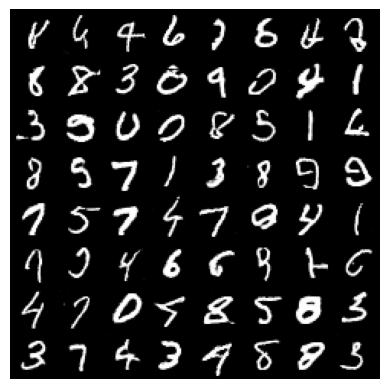

Epoch [17/100], Batch [100/938], D_real: 0.9817, D_fake: 0.1884, Loss_D: 0.2957, Loss_G: 1.9361
Epoch [17/100], Batch [200/938], D_real: 0.8047, D_fake: 0.0705, Loss_D: 0.3374, Loss_G: 2.9191
Epoch [17/100], Batch [300/938], D_real: 0.7170, D_fake: 0.0153, Loss_D: 0.4855, Loss_G: 5.4181
Epoch [17/100], Batch [400/938], D_real: 0.8996, D_fake: 0.0996, Loss_D: 0.2469, Loss_G: 3.2206
Epoch [17/100], Batch [500/938], D_real: 0.9206, D_fake: 0.1082, Loss_D: 0.2384, Loss_G: 2.5398
Epoch [17/100], Batch [600/938], D_real: 0.9875, D_fake: 0.2650, Loss_D: 0.4082, Loss_G: 4.1652
Epoch [17/100], Batch [700/938], D_real: 0.9402, D_fake: 0.0859, Loss_D: 0.1846, Loss_G: 2.6946
Epoch [17/100], Batch [800/938], D_real: 0.8068, D_fake: 0.0375, Loss_D: 0.3264, Loss_G: 4.6873
Epoch [17/100], Batch [900/938], D_real: 0.9277, D_fake: 0.0585, Loss_D: 0.1569, Loss_G: 4.2981


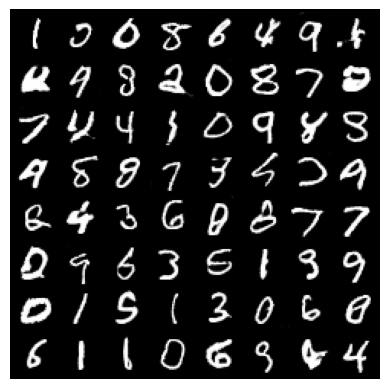

Epoch [18/100], Batch [100/938], D_real: 0.9787, D_fake: 0.2094, Loss_D: 0.3673, Loss_G: 2.8365
Epoch [18/100], Batch [200/938], D_real: 0.9862, D_fake: 0.2424, Loss_D: 0.4133, Loss_G: 3.5009
Epoch [18/100], Batch [300/938], D_real: 0.9090, D_fake: 0.0864, Loss_D: 0.2173, Loss_G: 3.5069
Epoch [18/100], Batch [400/938], D_real: 0.9331, D_fake: 0.1753, Loss_D: 0.3792, Loss_G: 2.4955
Epoch [18/100], Batch [500/938], D_real: 0.9896, D_fake: 0.1305, Loss_D: 0.1903, Loss_G: 2.4643
Epoch [18/100], Batch [600/938], D_real: 0.9742, D_fake: 0.1915, Loss_D: 0.3126, Loss_G: 3.6347
Epoch [18/100], Batch [700/938], D_real: 0.9558, D_fake: 0.1702, Loss_D: 0.2775, Loss_G: 3.1444
Epoch [18/100], Batch [800/938], D_real: 0.9433, D_fake: 0.0557, Loss_D: 0.1293, Loss_G: 4.8199
Epoch [18/100], Batch [900/938], D_real: 0.6570, D_fake: 0.0124, Loss_D: 0.6529, Loss_G: 3.3332


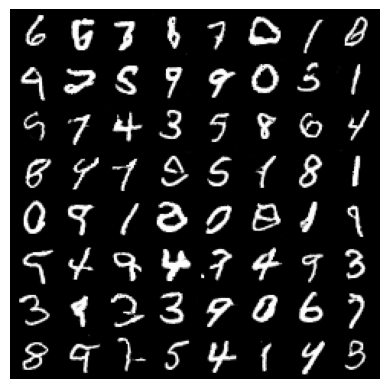

Epoch [19/100], Batch [100/938], D_real: 0.9508, D_fake: 0.1030, Loss_D: 0.1930, Loss_G: 2.1200
Epoch [19/100], Batch [200/938], D_real: 0.9546, D_fake: 0.1420, Loss_D: 0.2501, Loss_G: 4.3649
Epoch [19/100], Batch [300/938], D_real: 0.9634, D_fake: 0.0998, Loss_D: 0.1778, Loss_G: 2.5529
Epoch [19/100], Batch [400/938], D_real: 0.9167, D_fake: 0.1005, Loss_D: 0.2220, Loss_G: 3.1004
Epoch [19/100], Batch [500/938], D_real: 0.9241, D_fake: 0.0932, Loss_D: 0.2006, Loss_G: 4.2725
Epoch [19/100], Batch [600/938], D_real: 0.9805, D_fake: 0.2528, Loss_D: 0.4450, Loss_G: 2.6839
Epoch [19/100], Batch [700/938], D_real: 0.9445, D_fake: 0.1209, Loss_D: 0.2257, Loss_G: 3.2357
Epoch [19/100], Batch [800/938], D_real: 0.9787, D_fake: 0.1153, Loss_D: 0.2017, Loss_G: 3.5472
Epoch [19/100], Batch [900/938], D_real: 0.9867, D_fake: 0.1774, Loss_D: 0.2631, Loss_G: 3.0973


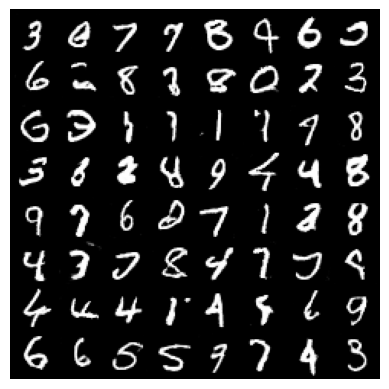

Epoch [20/100], Batch [100/938], D_real: 0.9744, D_fake: 0.1005, Loss_D: 0.1594, Loss_G: 3.2658
Epoch [20/100], Batch [200/938], D_real: 0.8732, D_fake: 0.0469, Loss_D: 0.2292, Loss_G: 4.4080
Epoch [20/100], Batch [300/938], D_real: 0.8835, D_fake: 0.0636, Loss_D: 0.2201, Loss_G: 3.5412
Epoch [20/100], Batch [400/938], D_real: 0.7000, D_fake: 0.0459, Loss_D: 0.4877, Loss_G: 2.8445
Epoch [20/100], Batch [500/938], D_real: 0.8514, D_fake: 0.0486, Loss_D: 0.2540, Loss_G: 3.1377
Epoch [20/100], Batch [600/938], D_real: 0.7749, D_fake: 0.1069, Loss_D: 0.4616, Loss_G: 1.9123
Epoch [20/100], Batch [700/938], D_real: 0.9775, D_fake: 0.0993, Loss_D: 0.1647, Loss_G: 2.9202
Epoch [20/100], Batch [800/938], D_real: 0.9188, D_fake: 0.0301, Loss_D: 0.1311, Loss_G: 4.9493
Epoch [20/100], Batch [900/938], D_real: 0.9757, D_fake: 0.2168, Loss_D: 0.3234, Loss_G: 2.5484


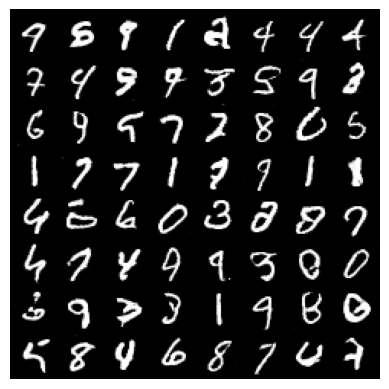

Epoch [21/100], Batch [100/938], D_real: 0.9722, D_fake: 0.0395, Loss_D: 0.0728, Loss_G: 5.6762
Epoch [21/100], Batch [200/938], D_real: 0.7805, D_fake: 0.0576, Loss_D: 0.3778, Loss_G: 4.1390
Epoch [21/100], Batch [300/938], D_real: 0.9730, D_fake: 0.1610, Loss_D: 0.2651, Loss_G: 3.5223
Epoch [21/100], Batch [400/938], D_real: 0.9687, D_fake: 0.0580, Loss_D: 0.0979, Loss_G: 3.8545
Epoch [21/100], Batch [500/938], D_real: 0.7916, D_fake: 0.1591, Loss_D: 0.4682, Loss_G: 2.8759
Epoch [21/100], Batch [600/938], D_real: 0.9563, D_fake: 0.1038, Loss_D: 0.1962, Loss_G: 3.2552
Epoch [21/100], Batch [700/938], D_real: 0.8898, D_fake: 0.0478, Loss_D: 0.1861, Loss_G: 4.0275
Epoch [21/100], Batch [800/938], D_real: 0.9929, D_fake: 0.1796, Loss_D: 0.2664, Loss_G: 3.3762
Epoch [21/100], Batch [900/938], D_real: 0.9635, D_fake: 0.0156, Loss_D: 0.0548, Loss_G: 5.0224


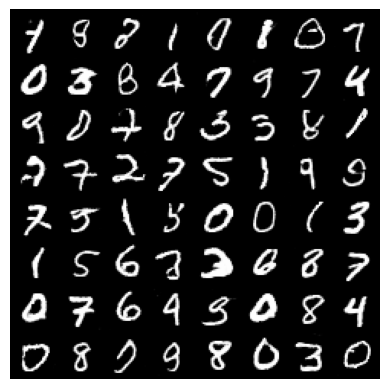

Epoch [22/100], Batch [100/938], D_real: 0.7862, D_fake: 0.0452, Loss_D: 0.3608, Loss_G: 4.1470
Epoch [22/100], Batch [200/938], D_real: 0.9285, D_fake: 0.2425, Loss_D: 0.4824, Loss_G: 2.0626
Epoch [22/100], Batch [300/938], D_real: 0.9742, D_fake: 0.3334, Loss_D: 0.7625, Loss_G: 1.4965
Epoch [22/100], Batch [400/938], D_real: 0.7174, D_fake: 0.0733, Loss_D: 0.5442, Loss_G: 4.0218
Epoch [22/100], Batch [500/938], D_real: 0.8716, D_fake: 0.0223, Loss_D: 0.1803, Loss_G: 4.6722
Epoch [22/100], Batch [600/938], D_real: 0.9083, D_fake: 0.1532, Loss_D: 0.3111, Loss_G: 2.9326
Epoch [22/100], Batch [700/938], D_real: 0.8987, D_fake: 0.0546, Loss_D: 0.1985, Loss_G: 3.4035
Epoch [22/100], Batch [800/938], D_real: 0.8270, D_fake: 0.0595, Loss_D: 0.3009, Loss_G: 5.5169
Epoch [22/100], Batch [900/938], D_real: 0.9705, D_fake: 0.1442, Loss_D: 0.2257, Loss_G: 4.0954


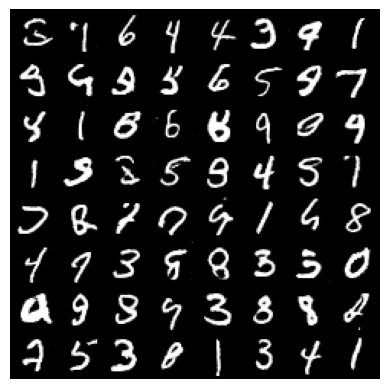

Epoch [23/100], Batch [100/938], D_real: 0.9686, D_fake: 0.0679, Loss_D: 0.1137, Loss_G: 3.8650
Epoch [23/100], Batch [200/938], D_real: 0.8629, D_fake: 0.0210, Loss_D: 0.2170, Loss_G: 5.2476
Epoch [23/100], Batch [300/938], D_real: 0.9521, D_fake: 0.0880, Loss_D: 0.1787, Loss_G: 4.2892
Epoch [23/100], Batch [400/938], D_real: 0.9851, D_fake: 0.1099, Loss_D: 0.1746, Loss_G: 4.0522
Epoch [23/100], Batch [500/938], D_real: 0.7519, D_fake: 0.0202, Loss_D: 0.3826, Loss_G: 4.9086
Epoch [23/100], Batch [600/938], D_real: 0.9508, D_fake: 0.1853, Loss_D: 0.3271, Loss_G: 3.0286
Epoch [23/100], Batch [700/938], D_real: 0.8913, D_fake: 0.0890, Loss_D: 0.2451, Loss_G: 3.9509
Epoch [23/100], Batch [800/938], D_real: 0.9620, D_fake: 0.1496, Loss_D: 0.2313, Loss_G: 2.7391
Epoch [23/100], Batch [900/938], D_real: 0.9821, D_fake: 0.1137, Loss_D: 0.1535, Loss_G: 3.9947


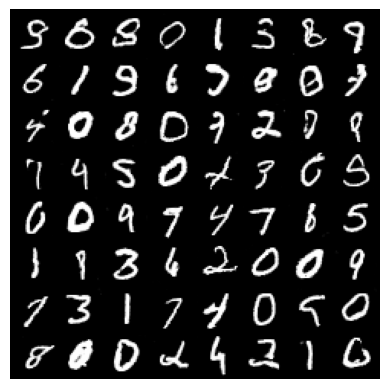

Epoch [24/100], Batch [100/938], D_real: 0.9461, D_fake: 0.1127, Loss_D: 0.1974, Loss_G: 2.6640
Epoch [24/100], Batch [200/938], D_real: 0.9652, D_fake: 0.1001, Loss_D: 0.1630, Loss_G: 4.2056
Epoch [24/100], Batch [300/938], D_real: 0.9080, D_fake: 0.0431, Loss_D: 0.1642, Loss_G: 5.0186
Epoch [24/100], Batch [400/938], D_real: 0.8921, D_fake: 0.1131, Loss_D: 0.3116, Loss_G: 3.6839
Epoch [24/100], Batch [500/938], D_real: 0.9407, D_fake: 0.1401, Loss_D: 0.2776, Loss_G: 3.8031
Epoch [24/100], Batch [600/938], D_real: 0.9422, D_fake: 0.0677, Loss_D: 0.1543, Loss_G: 3.6917
Epoch [24/100], Batch [700/938], D_real: 0.8528, D_fake: 0.1277, Loss_D: 0.3484, Loss_G: 3.8268
Epoch [24/100], Batch [800/938], D_real: 0.9695, D_fake: 0.1401, Loss_D: 0.2315, Loss_G: 4.0224
Epoch [24/100], Batch [900/938], D_real: 0.9810, D_fake: 0.1693, Loss_D: 0.2521, Loss_G: 2.2376


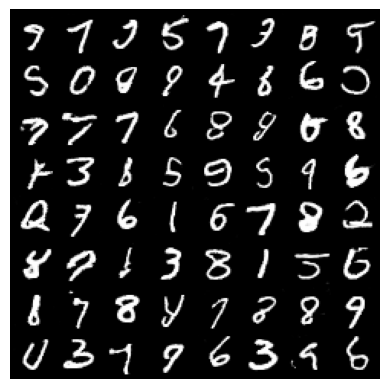

Epoch [25/100], Batch [100/938], D_real: 0.8565, D_fake: 0.1515, Loss_D: 0.4256, Loss_G: 3.9878
Epoch [25/100], Batch [200/938], D_real: 0.9759, D_fake: 0.2267, Loss_D: 0.3460, Loss_G: 3.6426
Epoch [25/100], Batch [300/938], D_real: 0.9562, D_fake: 0.1350, Loss_D: 0.2544, Loss_G: 4.0130
Epoch [25/100], Batch [400/938], D_real: 0.7200, D_fake: 0.0129, Loss_D: 0.4442, Loss_G: 5.9479
Epoch [25/100], Batch [500/938], D_real: 0.9112, D_fake: 0.0468, Loss_D: 0.1536, Loss_G: 5.5708
Epoch [25/100], Batch [600/938], D_real: 0.9163, D_fake: 0.1581, Loss_D: 0.3205, Loss_G: 3.1743
Epoch [25/100], Batch [700/938], D_real: 0.8485, D_fake: 0.0862, Loss_D: 0.3203, Loss_G: 4.4012
Epoch [25/100], Batch [800/938], D_real: 0.9440, D_fake: 0.0599, Loss_D: 0.1390, Loss_G: 4.3008
Epoch [25/100], Batch [900/938], D_real: 0.8358, D_fake: 0.0528, Loss_D: 0.2805, Loss_G: 4.3833


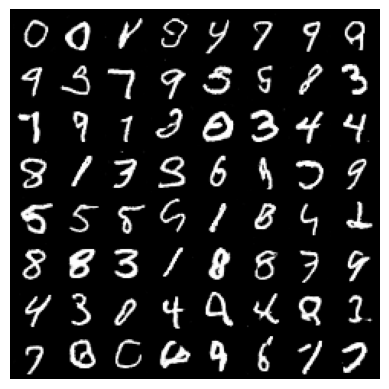

Epoch [26/100], Batch [100/938], D_real: 0.9944, D_fake: 0.4022, Loss_D: 0.7815, Loss_G: 2.4236
Epoch [26/100], Batch [200/938], D_real: 0.8989, D_fake: 0.0759, Loss_D: 0.2209, Loss_G: 4.6631
Epoch [26/100], Batch [300/938], D_real: 0.9201, D_fake: 0.0657, Loss_D: 0.1747, Loss_G: 4.1859
Epoch [26/100], Batch [400/938], D_real: 0.9537, D_fake: 0.1347, Loss_D: 0.2286, Loss_G: 2.7039
Epoch [26/100], Batch [500/938], D_real: 0.9231, D_fake: 0.1153, Loss_D: 0.2522, Loss_G: 2.5071
Epoch [26/100], Batch [600/938], D_real: 0.6436, D_fake: 0.0184, Loss_D: 0.6666, Loss_G: 5.2828
Epoch [26/100], Batch [700/938], D_real: 0.9292, D_fake: 0.0734, Loss_D: 0.1668, Loss_G: 4.3267
Epoch [26/100], Batch [800/938], D_real: 0.8183, D_fake: 0.0412, Loss_D: 0.3015, Loss_G: 5.1074
Epoch [26/100], Batch [900/938], D_real: 0.9872, D_fake: 0.1398, Loss_D: 0.1996, Loss_G: 3.4499


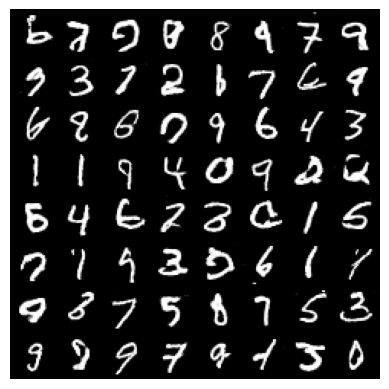

Epoch [27/100], Batch [100/938], D_real: 0.9784, D_fake: 0.2058, Loss_D: 0.3211, Loss_G: 3.1620
Epoch [27/100], Batch [200/938], D_real: 0.8002, D_fake: 0.0423, Loss_D: 0.3315, Loss_G: 4.4651
Epoch [27/100], Batch [300/938], D_real: 0.9935, D_fake: 0.1556, Loss_D: 0.2177, Loss_G: 3.5008
Epoch [27/100], Batch [400/938], D_real: 0.9632, D_fake: 0.1719, Loss_D: 0.2726, Loss_G: 2.7886
Epoch [27/100], Batch [500/938], D_real: 0.8576, D_fake: 0.1439, Loss_D: 0.3861, Loss_G: 3.4208
Epoch [27/100], Batch [600/938], D_real: 0.9522, D_fake: 0.1717, Loss_D: 0.2891, Loss_G: 3.2166
Epoch [27/100], Batch [700/938], D_real: 0.9799, D_fake: 0.1741, Loss_D: 0.3100, Loss_G: 2.9381
Epoch [27/100], Batch [800/938], D_real: 0.7928, D_fake: 0.0793, Loss_D: 0.4090, Loss_G: 4.7173
Epoch [27/100], Batch [900/938], D_real: 0.9706, D_fake: 0.1446, Loss_D: 0.2361, Loss_G: 3.9059


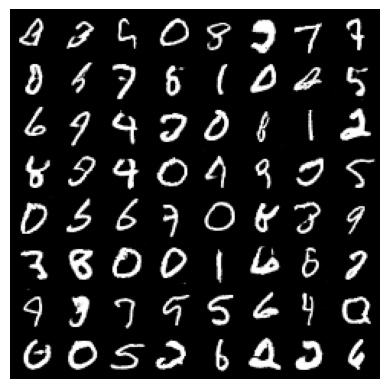

Epoch [28/100], Batch [100/938], D_real: 0.7100, D_fake: 0.0336, Loss_D: 0.5101, Loss_G: 3.6777
Epoch [28/100], Batch [200/938], D_real: 0.9094, D_fake: 0.0162, Loss_D: 0.1281, Loss_G: 5.1196
Epoch [28/100], Batch [300/938], D_real: 0.8965, D_fake: 0.0320, Loss_D: 0.1608, Loss_G: 4.8531
Epoch [28/100], Batch [400/938], D_real: 0.8580, D_fake: 0.0787, Loss_D: 0.2841, Loss_G: 4.6288
Epoch [28/100], Batch [500/938], D_real: 0.9018, D_fake: 0.0254, Loss_D: 0.1565, Loss_G: 5.9380
Epoch [28/100], Batch [600/938], D_real: 0.9760, D_fake: 0.1129, Loss_D: 0.1942, Loss_G: 3.7197
Epoch [28/100], Batch [700/938], D_real: 0.8813, D_fake: 0.0339, Loss_D: 0.1764, Loss_G: 5.8498
Epoch [28/100], Batch [800/938], D_real: 0.9304, D_fake: 0.1814, Loss_D: 0.3611, Loss_G: 4.0432
Epoch [28/100], Batch [900/938], D_real: 0.9253, D_fake: 0.0834, Loss_D: 0.1870, Loss_G: 3.5906


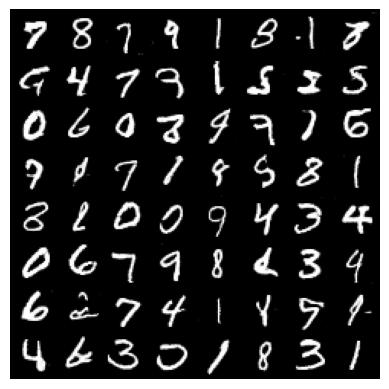

Epoch [29/100], Batch [100/938], D_real: 0.9415, D_fake: 0.0482, Loss_D: 0.1182, Loss_G: 3.6066
Epoch [29/100], Batch [200/938], D_real: 0.7186, D_fake: 0.0627, Loss_D: 0.5002, Loss_G: 3.5221
Epoch [29/100], Batch [300/938], D_real: 0.8096, D_fake: 0.0961, Loss_D: 0.3868, Loss_G: 2.8402
Epoch [29/100], Batch [400/938], D_real: 0.9182, D_fake: 0.0762, Loss_D: 0.2173, Loss_G: 5.5032
Epoch [29/100], Batch [500/938], D_real: 0.8913, D_fake: 0.0376, Loss_D: 0.1740, Loss_G: 4.9867
Epoch [29/100], Batch [600/938], D_real: 0.9392, D_fake: 0.0513, Loss_D: 0.1359, Loss_G: 5.0259
Epoch [29/100], Batch [700/938], D_real: 0.9517, D_fake: 0.1190, Loss_D: 0.2140, Loss_G: 3.9870
Epoch [29/100], Batch [800/938], D_real: 0.9911, D_fake: 0.3009, Loss_D: 0.5269, Loss_G: 2.4060
Epoch [29/100], Batch [900/938], D_real: 0.9486, D_fake: 0.0910, Loss_D: 0.1760, Loss_G: 3.7706


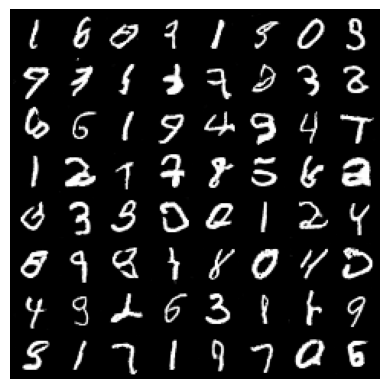

Epoch [30/100], Batch [100/938], D_real: 0.9378, D_fake: 0.1412, Loss_D: 0.2514, Loss_G: 4.0877
Epoch [30/100], Batch [200/938], D_real: 0.9093, D_fake: 0.0158, Loss_D: 0.1228, Loss_G: 7.5426
Epoch [30/100], Batch [300/938], D_real: 0.8245, D_fake: 0.0258, Loss_D: 0.2559, Loss_G: 4.3911
Epoch [30/100], Batch [400/938], D_real: 0.8499, D_fake: 0.0621, Loss_D: 0.2737, Loss_G: 3.7555
Epoch [30/100], Batch [500/938], D_real: 0.9483, D_fake: 0.0538, Loss_D: 0.1255, Loss_G: 4.0963
Epoch [30/100], Batch [600/938], D_real: 0.8746, D_fake: 0.0728, Loss_D: 0.2487, Loss_G: 4.2571
Epoch [30/100], Batch [700/938], D_real: 0.8667, D_fake: 0.0506, Loss_D: 0.2272, Loss_G: 4.5986
Epoch [30/100], Batch [800/938], D_real: 0.9686, D_fake: 0.2188, Loss_D: 0.3821, Loss_G: 3.3957
Epoch [30/100], Batch [900/938], D_real: 0.9366, D_fake: 0.0448, Loss_D: 0.1274, Loss_G: 4.4610


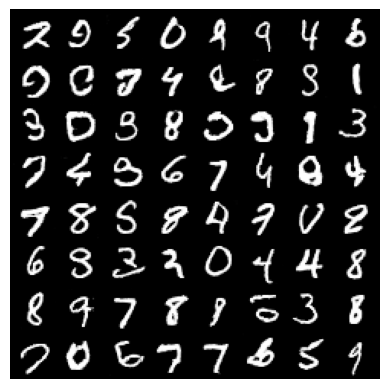

Epoch [31/100], Batch [100/938], D_real: 0.9771, D_fake: 0.0682, Loss_D: 0.1118, Loss_G: 4.4035
Epoch [31/100], Batch [200/938], D_real: 0.7765, D_fake: 0.0301, Loss_D: 0.3675, Loss_G: 3.8180
Epoch [31/100], Batch [300/938], D_real: 0.9138, D_fake: 0.1216, Loss_D: 0.2481, Loss_G: 4.2182
Epoch [31/100], Batch [400/938], D_real: 0.9554, D_fake: 0.0709, Loss_D: 0.1359, Loss_G: 3.7948
Epoch [31/100], Batch [500/938], D_real: 0.8025, D_fake: 0.0312, Loss_D: 0.3188, Loss_G: 4.7292
Epoch [31/100], Batch [600/938], D_real: 0.9011, D_fake: 0.0676, Loss_D: 0.2041, Loss_G: 3.3509
Epoch [31/100], Batch [700/938], D_real: 0.9026, D_fake: 0.0990, Loss_D: 0.2656, Loss_G: 3.4441
Epoch [31/100], Batch [800/938], D_real: 0.9760, D_fake: 0.3220, Loss_D: 0.5622, Loss_G: 3.7757
Epoch [31/100], Batch [900/938], D_real: 0.9533, D_fake: 0.0504, Loss_D: 0.1211, Loss_G: 3.8736


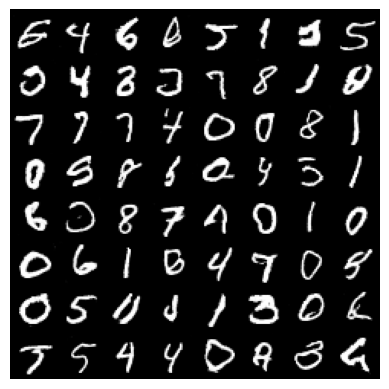

Epoch [32/100], Batch [100/938], D_real: 0.8794, D_fake: 0.0477, Loss_D: 0.2079, Loss_G: 4.0393
Epoch [32/100], Batch [200/938], D_real: 0.9405, D_fake: 0.0621, Loss_D: 0.1418, Loss_G: 5.1587
Epoch [32/100], Batch [300/938], D_real: 0.9511, D_fake: 0.0390, Loss_D: 0.0965, Loss_G: 5.2165
Epoch [32/100], Batch [400/938], D_real: 0.8756, D_fake: 0.1373, Loss_D: 0.3404, Loss_G: 3.1892
Epoch [32/100], Batch [500/938], D_real: 0.9242, D_fake: 0.0473, Loss_D: 0.1504, Loss_G: 4.5334
Epoch [32/100], Batch [600/938], D_real: 0.8703, D_fake: 0.1268, Loss_D: 0.3572, Loss_G: 4.2064
Epoch [32/100], Batch [700/938], D_real: 0.9825, D_fake: 0.3763, Loss_D: 0.7874, Loss_G: 2.5141
Epoch [32/100], Batch [800/938], D_real: 0.8795, D_fake: 0.0281, Loss_D: 0.1771, Loss_G: 5.4714
Epoch [32/100], Batch [900/938], D_real: 0.9671, D_fake: 0.2678, Loss_D: 0.4490, Loss_G: 2.7150


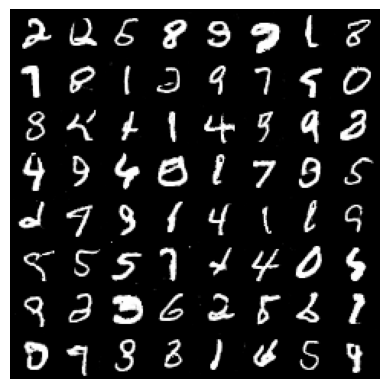

Epoch [33/100], Batch [100/938], D_real: 0.9609, D_fake: 0.0648, Loss_D: 0.1146, Loss_G: 4.0222
Epoch [33/100], Batch [200/938], D_real: 0.7693, D_fake: 0.0061, Loss_D: 0.3539, Loss_G: 5.6178
Epoch [33/100], Batch [300/938], D_real: 0.8003, D_fake: 0.0065, Loss_D: 0.2672, Loss_G: 5.0514
Epoch [33/100], Batch [400/938], D_real: 0.9158, D_fake: 0.1154, Loss_D: 0.2889, Loss_G: 4.5422
Epoch [33/100], Batch [500/938], D_real: 0.8972, D_fake: 0.1258, Loss_D: 0.2991, Loss_G: 3.8435
Epoch [33/100], Batch [600/938], D_real: 0.9735, D_fake: 0.0901, Loss_D: 0.1374, Loss_G: 4.0294
Epoch [33/100], Batch [700/938], D_real: 0.7803, D_fake: 0.0257, Loss_D: 0.3806, Loss_G: 5.1579
Epoch [33/100], Batch [800/938], D_real: 0.9771, D_fake: 0.2063, Loss_D: 0.3809, Loss_G: 2.7997
Epoch [33/100], Batch [900/938], D_real: 0.6301, D_fake: 0.0117, Loss_D: 0.6279, Loss_G: 4.3981


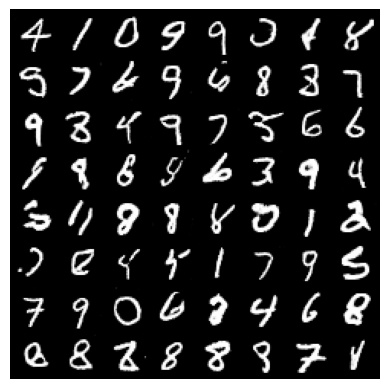

Epoch [34/100], Batch [100/938], D_real: 0.8318, D_fake: 0.0242, Loss_D: 0.2821, Loss_G: 4.7666
Epoch [34/100], Batch [200/938], D_real: 0.9803, D_fake: 0.0527, Loss_D: 0.0812, Loss_G: 4.4735
Epoch [34/100], Batch [300/938], D_real: 0.9828, D_fake: 0.0776, Loss_D: 0.1272, Loss_G: 4.6530
Epoch [34/100], Batch [400/938], D_real: 0.8491, D_fake: 0.0353, Loss_D: 0.2425, Loss_G: 4.7493
Epoch [34/100], Batch [500/938], D_real: 0.9291, D_fake: 0.0672, Loss_D: 0.1754, Loss_G: 5.0171
Epoch [34/100], Batch [600/938], D_real: 0.9503, D_fake: 0.0680, Loss_D: 0.1324, Loss_G: 4.1919
Epoch [34/100], Batch [700/938], D_real: 0.8823, D_fake: 0.0483, Loss_D: 0.2046, Loss_G: 4.3647
Epoch [34/100], Batch [800/938], D_real: 0.9011, D_fake: 0.0606, Loss_D: 0.1856, Loss_G: 3.8344
Epoch [34/100], Batch [900/938], D_real: 0.9141, D_fake: 0.0422, Loss_D: 0.1498, Loss_G: 4.6306


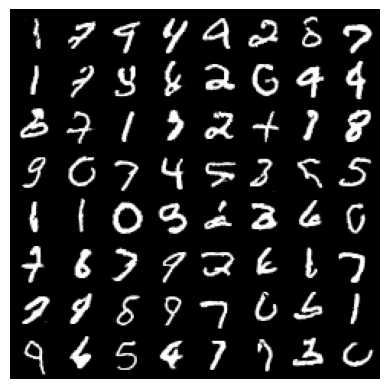

Epoch [35/100], Batch [100/938], D_real: 0.9448, D_fake: 0.1435, Loss_D: 0.2720, Loss_G: 3.1628
Epoch [35/100], Batch [200/938], D_real: 0.9571, D_fake: 0.0755, Loss_D: 0.1361, Loss_G: 3.2671
Epoch [35/100], Batch [300/938], D_real: 0.9549, D_fake: 0.0955, Loss_D: 0.1658, Loss_G: 4.4430
Epoch [35/100], Batch [400/938], D_real: 0.9658, D_fake: 0.0394, Loss_D: 0.0812, Loss_G: 3.9963
Epoch [35/100], Batch [500/938], D_real: 0.9460, D_fake: 0.0692, Loss_D: 0.1496, Loss_G: 3.8895
Epoch [35/100], Batch [600/938], D_real: 0.8202, D_fake: 0.0237, Loss_D: 0.2741, Loss_G: 4.7174
Epoch [35/100], Batch [700/938], D_real: 0.9228, D_fake: 0.0467, Loss_D: 0.1477, Loss_G: 3.9330
Epoch [35/100], Batch [800/938], D_real: 0.6675, D_fake: 0.0636, Loss_D: 0.6499, Loss_G: 4.0843
Epoch [35/100], Batch [900/938], D_real: 0.9922, D_fake: 0.3364, Loss_D: 0.6189, Loss_G: 3.1744


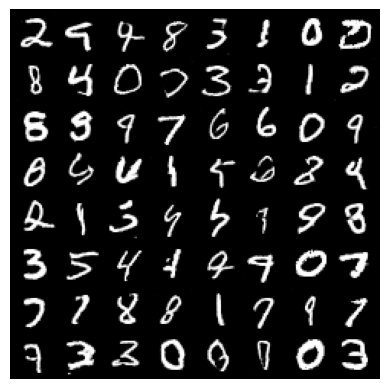

Epoch [36/100], Batch [100/938], D_real: 0.9746, D_fake: 0.2599, Loss_D: 0.4462, Loss_G: 4.3926
Epoch [36/100], Batch [200/938], D_real: 0.9276, D_fake: 0.0331, Loss_D: 0.1204, Loss_G: 4.5397
Epoch [36/100], Batch [300/938], D_real: 0.9927, D_fake: 0.2532, Loss_D: 0.3787, Loss_G: 2.6834
Epoch [36/100], Batch [400/938], D_real: 0.9071, D_fake: 0.0733, Loss_D: 0.1983, Loss_G: 5.5018
Epoch [36/100], Batch [500/938], D_real: 0.9719, D_fake: 0.0411, Loss_D: 0.0731, Loss_G: 4.9271
Epoch [36/100], Batch [600/938], D_real: 0.8128, D_fake: 0.0206, Loss_D: 0.2627, Loss_G: 5.7351
Epoch [36/100], Batch [700/938], D_real: 0.8636, D_fake: 0.1498, Loss_D: 0.3955, Loss_G: 2.8889
Epoch [36/100], Batch [800/938], D_real: 0.9812, D_fake: 0.0907, Loss_D: 0.1326, Loss_G: 4.2575
Epoch [36/100], Batch [900/938], D_real: 0.8762, D_fake: 0.0315, Loss_D: 0.1876, Loss_G: 5.2893


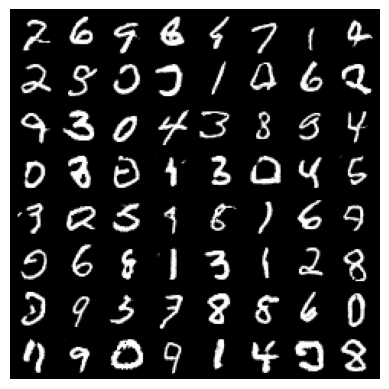

Epoch [37/100], Batch [100/938], D_real: 0.8979, D_fake: 0.0385, Loss_D: 0.1653, Loss_G: 5.1185
Epoch [37/100], Batch [200/938], D_real: 0.9313, D_fake: 0.1341, Loss_D: 0.2687, Loss_G: 4.1315
Epoch [37/100], Batch [300/938], D_real: 0.9138, D_fake: 0.1707, Loss_D: 0.3571, Loss_G: 2.9479
Epoch [37/100], Batch [400/938], D_real: 0.9682, D_fake: 0.0860, Loss_D: 0.1405, Loss_G: 3.0700
Epoch [37/100], Batch [500/938], D_real: 0.9740, D_fake: 0.1255, Loss_D: 0.1924, Loss_G: 3.9390
Epoch [37/100], Batch [600/938], D_real: 0.9589, D_fake: 0.0948, Loss_D: 0.1584, Loss_G: 4.1080
Epoch [37/100], Batch [700/938], D_real: 0.8763, D_fake: 0.0786, Loss_D: 0.2500, Loss_G: 2.9138
Epoch [37/100], Batch [800/938], D_real: 0.9518, D_fake: 0.0241, Loss_D: 0.0789, Loss_G: 3.3717
Epoch [37/100], Batch [900/938], D_real: 0.9199, D_fake: 0.1518, Loss_D: 0.3232, Loss_G: 3.3331


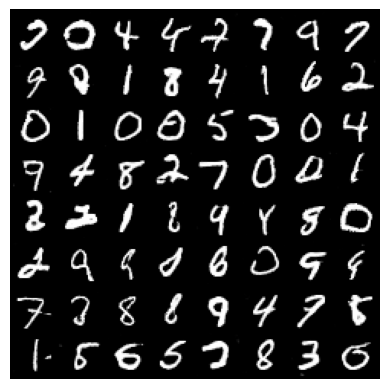

Epoch [38/100], Batch [100/938], D_real: 0.9291, D_fake: 0.1784, Loss_D: 0.3357, Loss_G: 3.6401
Epoch [38/100], Batch [200/938], D_real: 0.9792, D_fake: 0.1156, Loss_D: 0.1895, Loss_G: 4.4106
Epoch [38/100], Batch [300/938], D_real: 0.9253, D_fake: 0.0270, Loss_D: 0.1201, Loss_G: 6.3234
Epoch [38/100], Batch [400/938], D_real: 0.8861, D_fake: 0.0581, Loss_D: 0.2143, Loss_G: 4.3258
Epoch [38/100], Batch [500/938], D_real: 0.9319, D_fake: 0.1067, Loss_D: 0.2112, Loss_G: 3.0388
Epoch [38/100], Batch [600/938], D_real: 0.9515, D_fake: 0.1554, Loss_D: 0.2878, Loss_G: 3.8763
Epoch [38/100], Batch [700/938], D_real: 0.7294, D_fake: 0.0323, Loss_D: 0.4518, Loss_G: 4.2363
Epoch [38/100], Batch [800/938], D_real: 0.8298, D_fake: 0.0351, Loss_D: 0.2847, Loss_G: 5.5225
Epoch [38/100], Batch [900/938], D_real: 0.9621, D_fake: 0.0509, Loss_D: 0.0996, Loss_G: 3.7692


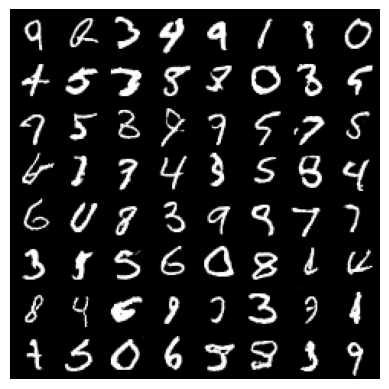

Epoch [39/100], Batch [100/938], D_real: 0.8129, D_fake: 0.0311, Loss_D: 0.2938, Loss_G: 5.9818
Epoch [39/100], Batch [200/938], D_real: 0.8757, D_fake: 0.0293, Loss_D: 0.2128, Loss_G: 5.3123
Epoch [39/100], Batch [300/938], D_real: 0.9498, D_fake: 0.0370, Loss_D: 0.0973, Loss_G: 3.8353
Epoch [39/100], Batch [400/938], D_real: 0.9478, D_fake: 0.0368, Loss_D: 0.0973, Loss_G: 5.0994
Epoch [39/100], Batch [500/938], D_real: 0.9179, D_fake: 0.0230, Loss_D: 0.1209, Loss_G: 5.8553
Epoch [39/100], Batch [600/938], D_real: 0.7611, D_fake: 0.0115, Loss_D: 0.3742, Loss_G: 4.3023
Epoch [39/100], Batch [700/938], D_real: 0.9602, D_fake: 0.1330, Loss_D: 0.2253, Loss_G: 2.2195
Epoch [39/100], Batch [800/938], D_real: 0.9451, D_fake: 0.0425, Loss_D: 0.1186, Loss_G: 5.9684
Epoch [39/100], Batch [900/938], D_real: 0.9739, D_fake: 0.1712, Loss_D: 0.2561, Loss_G: 3.8987


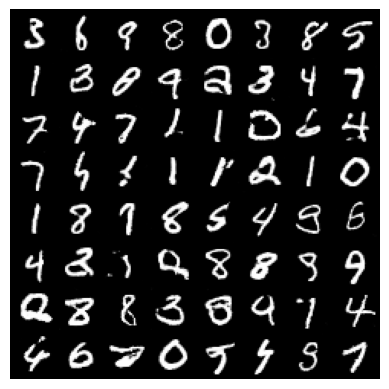

Epoch [40/100], Batch [100/938], D_real: 0.9612, D_fake: 0.0430, Loss_D: 0.0896, Loss_G: 4.9587
Epoch [40/100], Batch [200/938], D_real: 0.9410, D_fake: 0.0211, Loss_D: 0.0961, Loss_G: 5.5363
Epoch [40/100], Batch [300/938], D_real: 0.9016, D_fake: 0.0407, Loss_D: 0.1717, Loss_G: 6.1733
Epoch [40/100], Batch [400/938], D_real: 0.6944, D_fake: 0.0245, Loss_D: 0.4966, Loss_G: 3.9394
Epoch [40/100], Batch [500/938], D_real: 0.9430, D_fake: 0.2500, Loss_D: 0.4649, Loss_G: 3.5006
Epoch [40/100], Batch [600/938], D_real: 0.9201, D_fake: 0.0380, Loss_D: 0.1335, Loss_G: 4.8477
Epoch [40/100], Batch [700/938], D_real: 0.9865, D_fake: 0.1585, Loss_D: 0.2446, Loss_G: 3.4772
Epoch [40/100], Batch [800/938], D_real: 0.9446, D_fake: 0.0910, Loss_D: 0.1934, Loss_G: 3.7590
Epoch [40/100], Batch [900/938], D_real: 0.6736, D_fake: 0.0253, Loss_D: 0.5320, Loss_G: 4.1647


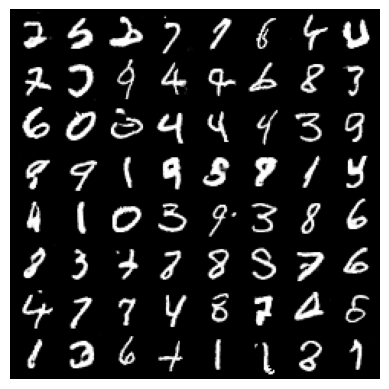

Epoch [41/100], Batch [100/938], D_real: 0.8987, D_fake: 0.0379, Loss_D: 0.1690, Loss_G: 3.8358
Epoch [41/100], Batch [200/938], D_real: 0.9769, D_fake: 0.1568, Loss_D: 0.2188, Loss_G: 2.6811
Epoch [41/100], Batch [300/938], D_real: 0.9078, D_fake: 0.0432, Loss_D: 0.1543, Loss_G: 3.9539
Epoch [41/100], Batch [400/938], D_real: 0.8056, D_fake: 0.0103, Loss_D: 0.2708, Loss_G: 4.9334
Epoch [41/100], Batch [500/938], D_real: 0.9253, D_fake: 0.1796, Loss_D: 0.3695, Loss_G: 3.9478
Epoch [41/100], Batch [600/938], D_real: 0.9854, D_fake: 0.1105, Loss_D: 0.1624, Loss_G: 3.1450
Epoch [41/100], Batch [700/938], D_real: 0.7744, D_fake: 0.1235, Loss_D: 0.5162, Loss_G: 2.5629
Epoch [41/100], Batch [800/938], D_real: 0.7394, D_fake: 0.0603, Loss_D: 0.4615, Loss_G: 4.2071
Epoch [41/100], Batch [900/938], D_real: 0.6961, D_fake: 0.0144, Loss_D: 0.4503, Loss_G: 5.2923


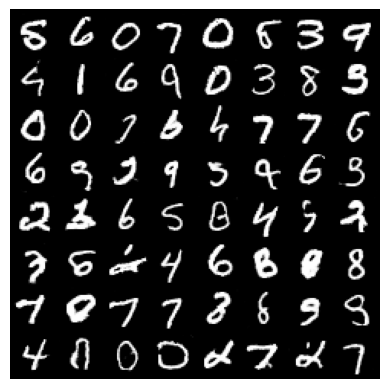

Epoch [42/100], Batch [100/938], D_real: 0.9011, D_fake: 0.0130, Loss_D: 0.1426, Loss_G: 5.6649
Epoch [42/100], Batch [200/938], D_real: 0.9305, D_fake: 0.0391, Loss_D: 0.1333, Loss_G: 5.6790
Epoch [42/100], Batch [300/938], D_real: 0.9038, D_fake: 0.1286, Loss_D: 0.2832, Loss_G: 3.1506
Epoch [42/100], Batch [400/938], D_real: 0.9365, D_fake: 0.0368, Loss_D: 0.1136, Loss_G: 5.5718
Epoch [42/100], Batch [500/938], D_real: 0.8892, D_fake: 0.1224, Loss_D: 0.3238, Loss_G: 4.1793
Epoch [42/100], Batch [600/938], D_real: 0.8838, D_fake: 0.0215, Loss_D: 0.1640, Loss_G: 5.8874
Epoch [42/100], Batch [700/938], D_real: 0.9225, D_fake: 0.0356, Loss_D: 0.1266, Loss_G: 5.4962
Epoch [42/100], Batch [800/938], D_real: 0.9048, D_fake: 0.0301, Loss_D: 0.1470, Loss_G: 5.0055
Epoch [42/100], Batch [900/938], D_real: 0.8873, D_fake: 0.0199, Loss_D: 0.1604, Loss_G: 5.0616


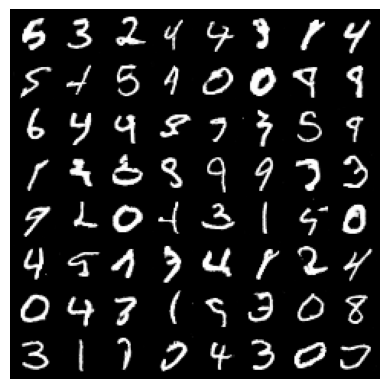

Epoch [43/100], Batch [100/938], D_real: 0.9437, D_fake: 0.0662, Loss_D: 0.1505, Loss_G: 4.2334
Epoch [43/100], Batch [200/938], D_real: 0.9672, D_fake: 0.1672, Loss_D: 0.2777, Loss_G: 3.7492
Epoch [43/100], Batch [300/938], D_real: 0.7789, D_fake: 0.0641, Loss_D: 0.4071, Loss_G: 3.9164
Epoch [43/100], Batch [400/938], D_real: 0.9170, D_fake: 0.0487, Loss_D: 0.1721, Loss_G: 3.3151
Epoch [43/100], Batch [500/938], D_real: 0.9533, D_fake: 0.1205, Loss_D: 0.2213, Loss_G: 4.5723
Epoch [43/100], Batch [600/938], D_real: 0.9672, D_fake: 0.0328, Loss_D: 0.0697, Loss_G: 4.5638
Epoch [43/100], Batch [700/938], D_real: 0.8684, D_fake: 0.0513, Loss_D: 0.2239, Loss_G: 3.3503
Epoch [43/100], Batch [800/938], D_real: 0.9717, D_fake: 0.0470, Loss_D: 0.0803, Loss_G: 4.8159
Epoch [43/100], Batch [900/938], D_real: 0.9873, D_fake: 0.4071, Loss_D: 0.8802, Loss_G: 2.6028


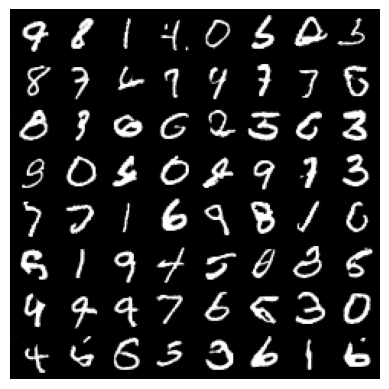

Epoch [44/100], Batch [100/938], D_real: 0.9713, D_fake: 0.1236, Loss_D: 0.1982, Loss_G: 3.2413
Epoch [44/100], Batch [200/938], D_real: 0.9731, D_fake: 0.1070, Loss_D: 0.1611, Loss_G: 2.6935
Epoch [44/100], Batch [300/938], D_real: 0.9157, D_fake: 0.0492, Loss_D: 0.1638, Loss_G: 5.5173
Epoch [44/100], Batch [400/938], D_real: 0.9539, D_fake: 0.0708, Loss_D: 0.1644, Loss_G: 4.7682
Epoch [44/100], Batch [500/938], D_real: 0.9590, D_fake: 0.1221, Loss_D: 0.2072, Loss_G: 5.3463
Epoch [44/100], Batch [600/938], D_real: 0.9558, D_fake: 0.1479, Loss_D: 0.2411, Loss_G: 2.4928
Epoch [44/100], Batch [700/938], D_real: 0.9321, D_fake: 0.0683, Loss_D: 0.1521, Loss_G: 3.2705
Epoch [44/100], Batch [800/938], D_real: 0.9826, D_fake: 0.3645, Loss_D: 0.7769, Loss_G: 1.8837
Epoch [44/100], Batch [900/938], D_real: 0.9471, D_fake: 0.1731, Loss_D: 0.2973, Loss_G: 3.0307


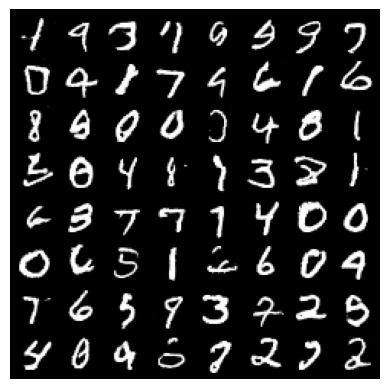

Epoch [45/100], Batch [100/938], D_real: 0.9877, D_fake: 0.2574, Loss_D: 0.3863, Loss_G: 3.0154
Epoch [45/100], Batch [200/938], D_real: 0.9672, D_fake: 0.0655, Loss_D: 0.1191, Loss_G: 5.1621
Epoch [45/100], Batch [300/938], D_real: 0.8535, D_fake: 0.0515, Loss_D: 0.2489, Loss_G: 3.6846
Epoch [45/100], Batch [400/938], D_real: 0.8636, D_fake: 0.0351, Loss_D: 0.2147, Loss_G: 4.4803
Epoch [45/100], Batch [500/938], D_real: 0.9128, D_fake: 0.0535, Loss_D: 0.1664, Loss_G: 3.7196
Epoch [45/100], Batch [600/938], D_real: 0.9456, D_fake: 0.0450, Loss_D: 0.1142, Loss_G: 4.7464
Epoch [45/100], Batch [700/938], D_real: 0.9736, D_fake: 0.0461, Loss_D: 0.1112, Loss_G: 5.1907
Epoch [45/100], Batch [800/938], D_real: 0.9015, D_fake: 0.1897, Loss_D: 0.4048, Loss_G: 3.3805
Epoch [45/100], Batch [900/938], D_real: 0.9794, D_fake: 0.0923, Loss_D: 0.1436, Loss_G: 3.9158


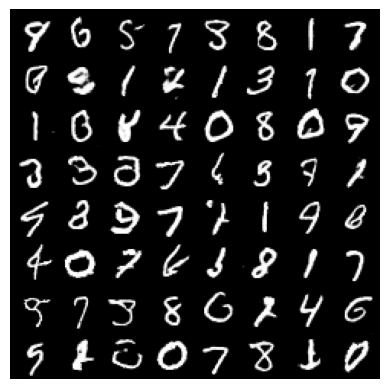

Epoch [46/100], Batch [100/938], D_real: 0.8546, D_fake: 0.0395, Loss_D: 0.2343, Loss_G: 5.0408
Epoch [46/100], Batch [200/938], D_real: 0.8522, D_fake: 0.0833, Loss_D: 0.3021, Loss_G: 2.9826
Epoch [46/100], Batch [300/938], D_real: 0.9743, D_fake: 0.1703, Loss_D: 0.3174, Loss_G: 3.5955
Epoch [46/100], Batch [400/938], D_real: 0.9623, D_fake: 0.0878, Loss_D: 0.1450, Loss_G: 4.1261
Epoch [46/100], Batch [500/938], D_real: 0.9294, D_fake: 0.0926, Loss_D: 0.1953, Loss_G: 3.8049
Epoch [46/100], Batch [600/938], D_real: 0.9684, D_fake: 0.1832, Loss_D: 0.3086, Loss_G: 3.2966
Epoch [46/100], Batch [700/938], D_real: 0.8503, D_fake: 0.0536, Loss_D: 0.2542, Loss_G: 3.6563
Epoch [46/100], Batch [800/938], D_real: 0.9364, D_fake: 0.0104, Loss_D: 0.0823, Loss_G: 5.5739
Epoch [46/100], Batch [900/938], D_real: 0.9821, D_fake: 0.1544, Loss_D: 0.2408, Loss_G: 4.0376


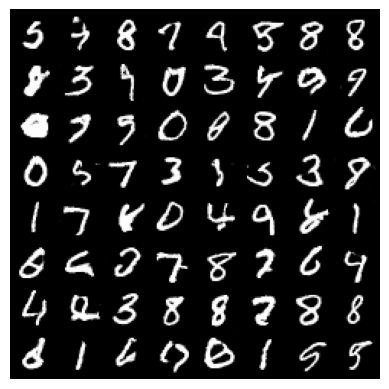

Epoch [47/100], Batch [100/938], D_real: 0.9982, D_fake: 0.4577, Loss_D: 0.9365, Loss_G: 2.3514
Epoch [47/100], Batch [200/938], D_real: 0.9483, D_fake: 0.0350, Loss_D: 0.0942, Loss_G: 5.4457
Epoch [47/100], Batch [300/938], D_real: 0.9849, D_fake: 0.2699, Loss_D: 0.4810, Loss_G: 2.7906
Epoch [47/100], Batch [400/938], D_real: 0.9676, D_fake: 0.0599, Loss_D: 0.1015, Loss_G: 3.5654
Epoch [47/100], Batch [500/938], D_real: 0.8789, D_fake: 0.0147, Loss_D: 0.1635, Loss_G: 5.6095
Epoch [47/100], Batch [600/938], D_real: 0.9152, D_fake: 0.0753, Loss_D: 0.2074, Loss_G: 3.9344
Epoch [47/100], Batch [700/938], D_real: 0.9705, D_fake: 0.0205, Loss_D: 0.0530, Loss_G: 4.8405
Epoch [47/100], Batch [800/938], D_real: 0.9533, D_fake: 0.0842, Loss_D: 0.1590, Loss_G: 4.3100
Epoch [47/100], Batch [900/938], D_real: 0.9660, D_fake: 0.0837, Loss_D: 0.1586, Loss_G: 4.4971


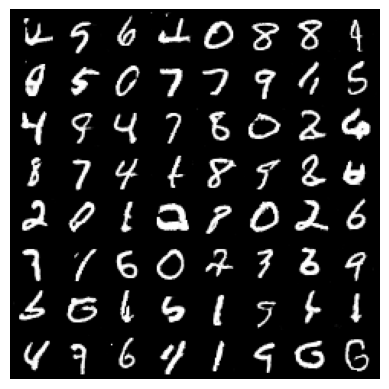

Epoch [48/100], Batch [100/938], D_real: 0.9873, D_fake: 0.0308, Loss_D: 0.0563, Loss_G: 5.2455
Epoch [48/100], Batch [200/938], D_real: 0.9733, D_fake: 0.1628, Loss_D: 0.2761, Loss_G: 3.5578
Epoch [48/100], Batch [300/938], D_real: 0.9757, D_fake: 0.3100, Loss_D: 0.5474, Loss_G: 3.3727
Epoch [48/100], Batch [400/938], D_real: 0.9434, D_fake: 0.0971, Loss_D: 0.2047, Loss_G: 2.9974
Epoch [48/100], Batch [500/938], D_real: 0.9844, D_fake: 0.0419, Loss_D: 0.0642, Loss_G: 5.1368
Epoch [48/100], Batch [600/938], D_real: 0.9492, D_fake: 0.1144, Loss_D: 0.2081, Loss_G: 5.1616
Epoch [48/100], Batch [700/938], D_real: 0.7484, D_fake: 0.0175, Loss_D: 0.4029, Loss_G: 4.5642
Epoch [48/100], Batch [800/938], D_real: 0.9703, D_fake: 0.2262, Loss_D: 0.3752, Loss_G: 4.2163
Epoch [48/100], Batch [900/938], D_real: 0.9576, D_fake: 0.0690, Loss_D: 0.1265, Loss_G: 3.9816


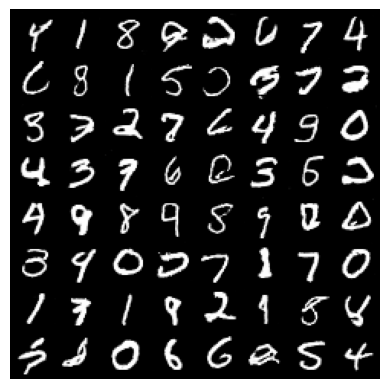

Epoch [49/100], Batch [100/938], D_real: 0.9518, D_fake: 0.0206, Loss_D: 0.0735, Loss_G: 4.3188
Epoch [49/100], Batch [200/938], D_real: 0.8729, D_fake: 0.0151, Loss_D: 0.1764, Loss_G: 4.5997
Epoch [49/100], Batch [300/938], D_real: 0.9758, D_fake: 0.0517, Loss_D: 0.0873, Loss_G: 4.3880
Epoch [49/100], Batch [400/938], D_real: 0.9844, D_fake: 0.0463, Loss_D: 0.0665, Loss_G: 4.5840
Epoch [49/100], Batch [500/938], D_real: 0.9739, D_fake: 0.0425, Loss_D: 0.0760, Loss_G: 4.7652
Epoch [49/100], Batch [600/938], D_real: 0.8158, D_fake: 0.0141, Loss_D: 0.2968, Loss_G: 5.6530
Epoch [49/100], Batch [700/938], D_real: 0.8927, D_fake: 0.0475, Loss_D: 0.2104, Loss_G: 4.0757
Epoch [49/100], Batch [800/938], D_real: 0.9276, D_fake: 0.1250, Loss_D: 0.2600, Loss_G: 3.3480
Epoch [49/100], Batch [900/938], D_real: 0.9151, D_fake: 0.1775, Loss_D: 0.3853, Loss_G: 4.7778


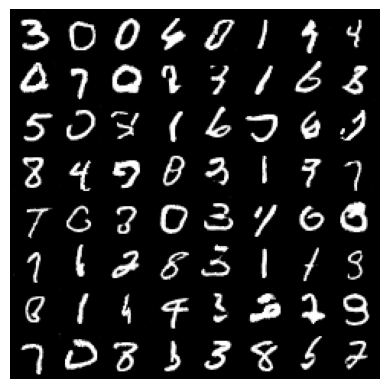

Epoch [50/100], Batch [100/938], D_real: 0.9774, D_fake: 0.0491, Loss_D: 0.0812, Loss_G: 4.8573
Epoch [50/100], Batch [200/938], D_real: 0.9672, D_fake: 0.0673, Loss_D: 0.1123, Loss_G: 4.4812
Epoch [50/100], Batch [300/938], D_real: 0.8585, D_fake: 0.1032, Loss_D: 0.3355, Loss_G: 4.5898
Epoch [50/100], Batch [400/938], D_real: 0.9805, D_fake: 0.0420, Loss_D: 0.0678, Loss_G: 4.2590
Epoch [50/100], Batch [500/938], D_real: 0.9857, D_fake: 0.3444, Loss_D: 0.6759, Loss_G: 1.9322
Epoch [50/100], Batch [600/938], D_real: 0.7730, D_fake: 0.0340, Loss_D: 0.3540, Loss_G: 4.7614
Epoch [50/100], Batch [700/938], D_real: 0.9333, D_fake: 0.1242, Loss_D: 0.2416, Loss_G: 3.6633
Epoch [50/100], Batch [800/938], D_real: 0.9727, D_fake: 0.0886, Loss_D: 0.1335, Loss_G: 3.8754
Epoch [50/100], Batch [900/938], D_real: 0.8236, D_fake: 0.1226, Loss_D: 0.3834, Loss_G: 1.9363


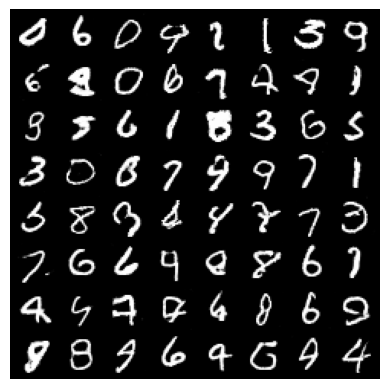

Epoch [51/100], Batch [100/938], D_real: 0.9828, D_fake: 0.0350, Loss_D: 0.0578, Loss_G: 4.6987
Epoch [51/100], Batch [200/938], D_real: 0.9593, D_fake: 0.0783, Loss_D: 0.1454, Loss_G: 4.2466
Epoch [51/100], Batch [300/938], D_real: 0.9560, D_fake: 0.0142, Loss_D: 0.0615, Loss_G: 6.2956
Epoch [51/100], Batch [400/938], D_real: 0.9963, D_fake: 0.2502, Loss_D: 0.4243, Loss_G: 3.3070
Epoch [51/100], Batch [500/938], D_real: 0.9420, D_fake: 0.0841, Loss_D: 0.1675, Loss_G: 4.2271
Epoch [51/100], Batch [600/938], D_real: 0.9097, D_fake: 0.0380, Loss_D: 0.1505, Loss_G: 4.7680
Epoch [51/100], Batch [700/938], D_real: 0.9227, D_fake: 0.0712, Loss_D: 0.1815, Loss_G: 4.7998
Epoch [51/100], Batch [800/938], D_real: 0.9100, D_fake: 0.0646, Loss_D: 0.1839, Loss_G: 3.1133
Epoch [51/100], Batch [900/938], D_real: 0.6870, D_fake: 0.0096, Loss_D: 0.4700, Loss_G: 6.0786


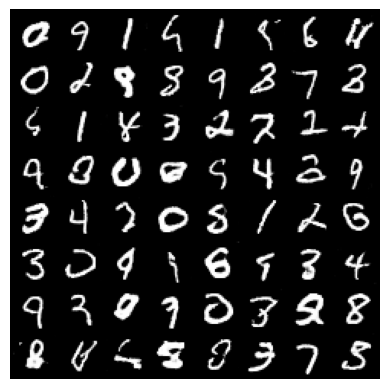

Epoch [52/100], Batch [100/938], D_real: 0.9850, D_fake: 0.0518, Loss_D: 0.0738, Loss_G: 4.8838
Epoch [52/100], Batch [200/938], D_real: 0.9658, D_fake: 0.0569, Loss_D: 0.1121, Loss_G: 4.8439
Epoch [52/100], Batch [300/938], D_real: 0.9821, D_fake: 0.1945, Loss_D: 0.3360, Loss_G: 2.9295
Epoch [52/100], Batch [400/938], D_real: 0.8750, D_fake: 0.0230, Loss_D: 0.2016, Loss_G: 4.2989
Epoch [52/100], Batch [500/938], D_real: 0.7620, D_fake: 0.0106, Loss_D: 0.3486, Loss_G: 5.4869
Epoch [52/100], Batch [600/938], D_real: 0.7687, D_fake: 0.0201, Loss_D: 0.3880, Loss_G: 4.5222
Epoch [52/100], Batch [700/938], D_real: 0.9468, D_fake: 0.1393, Loss_D: 0.2408, Loss_G: 3.3126
Epoch [52/100], Batch [800/938], D_real: 0.9528, D_fake: 0.0326, Loss_D: 0.0922, Loss_G: 5.0875
Epoch [52/100], Batch [900/938], D_real: 0.4974, D_fake: 0.0035, Loss_D: 1.0410, Loss_G: 6.6043


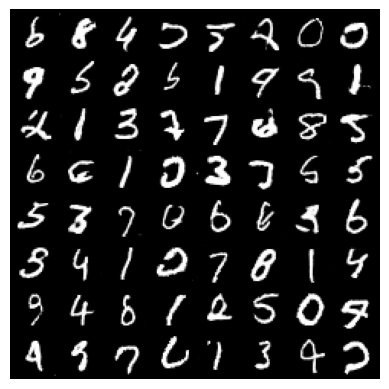

Epoch [53/100], Batch [100/938], D_real: 0.9774, D_fake: 0.2879, Loss_D: 0.4844, Loss_G: 2.3620
Epoch [53/100], Batch [200/938], D_real: 0.9117, D_fake: 0.0266, Loss_D: 0.1343, Loss_G: 4.9901
Epoch [53/100], Batch [300/938], D_real: 0.8991, D_fake: 0.0568, Loss_D: 0.1947, Loss_G: 4.5519
Epoch [53/100], Batch [400/938], D_real: 0.9614, D_fake: 0.1328, Loss_D: 0.2383, Loss_G: 3.5028
Epoch [53/100], Batch [500/938], D_real: 0.9919, D_fake: 0.0688, Loss_D: 0.0961, Loss_G: 3.8036
Epoch [53/100], Batch [600/938], D_real: 0.9200, D_fake: 0.0218, Loss_D: 0.1125, Loss_G: 5.6480
Epoch [53/100], Batch [700/938], D_real: 0.7582, D_fake: 0.0280, Loss_D: 0.3990, Loss_G: 5.1517
Epoch [53/100], Batch [800/938], D_real: 0.8637, D_fake: 0.0079, Loss_D: 0.1760, Loss_G: 5.3598
Epoch [53/100], Batch [900/938], D_real: 0.9680, D_fake: 0.0778, Loss_D: 0.1377, Loss_G: 2.9066


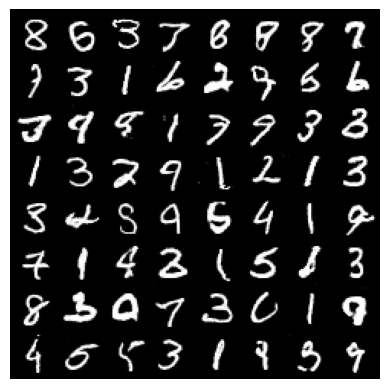

Epoch [54/100], Batch [100/938], D_real: 0.9069, D_fake: 0.0314, Loss_D: 0.1427, Loss_G: 5.7520
Epoch [54/100], Batch [200/938], D_real: 0.9264, D_fake: 0.0928, Loss_D: 0.2635, Loss_G: 2.7719
Epoch [54/100], Batch [300/938], D_real: 0.9710, D_fake: 0.0946, Loss_D: 0.1487, Loss_G: 3.5896
Epoch [54/100], Batch [400/938], D_real: 0.8010, D_fake: 0.0158, Loss_D: 0.2962, Loss_G: 4.3099
Epoch [54/100], Batch [500/938], D_real: 0.8669, D_fake: 0.0087, Loss_D: 0.1677, Loss_G: 6.4214
Epoch [54/100], Batch [600/938], D_real: 0.9893, D_fake: 0.1415, Loss_D: 0.2028, Loss_G: 3.0883
Epoch [54/100], Batch [700/938], D_real: 0.9923, D_fake: 0.2132, Loss_D: 0.3473, Loss_G: 4.4646
Epoch [54/100], Batch [800/938], D_real: 0.7811, D_fake: 0.0161, Loss_D: 0.3549, Loss_G: 5.9116
Epoch [54/100], Batch [900/938], D_real: 0.8973, D_fake: 0.0660, Loss_D: 0.2015, Loss_G: 4.1548


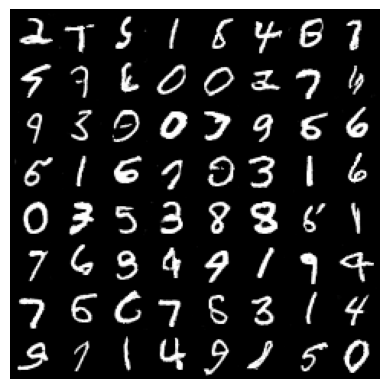

Epoch [55/100], Batch [100/938], D_real: 0.9740, D_fake: 0.0692, Loss_D: 0.1143, Loss_G: 4.6199
Epoch [55/100], Batch [200/938], D_real: 0.9353, D_fake: 0.0897, Loss_D: 0.1923, Loss_G: 4.4919
Epoch [55/100], Batch [300/938], D_real: 0.9419, D_fake: 0.0362, Loss_D: 0.1041, Loss_G: 4.5565
Epoch [55/100], Batch [400/938], D_real: 0.9633, D_fake: 0.0119, Loss_D: 0.0538, Loss_G: 6.2532
Epoch [55/100], Batch [500/938], D_real: 0.9531, D_fake: 0.1703, Loss_D: 0.2754, Loss_G: 3.4696
Epoch [55/100], Batch [600/938], D_real: 0.9675, D_fake: 0.0578, Loss_D: 0.1028, Loss_G: 5.6876
Epoch [55/100], Batch [700/938], D_real: 0.7178, D_fake: 0.0587, Loss_D: 0.5009, Loss_G: 3.9445
Epoch [55/100], Batch [800/938], D_real: 0.9397, D_fake: 0.1263, Loss_D: 0.2350, Loss_G: 3.4744
Epoch [55/100], Batch [900/938], D_real: 0.9407, D_fake: 0.1349, Loss_D: 0.2436, Loss_G: 3.0989


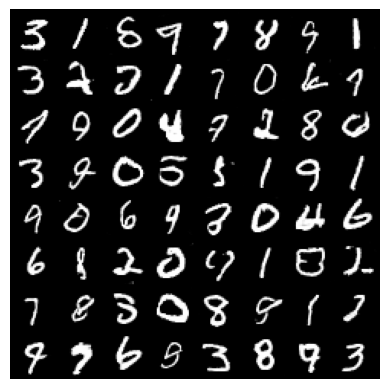

Epoch [56/100], Batch [100/938], D_real: 0.9871, D_fake: 0.1046, Loss_D: 0.1532, Loss_G: 2.6031
Epoch [56/100], Batch [200/938], D_real: 0.9519, D_fake: 0.0207, Loss_D: 0.0978, Loss_G: 6.2263
Epoch [56/100], Batch [300/938], D_real: 0.9121, D_fake: 0.0604, Loss_D: 0.2101, Loss_G: 6.1771
Epoch [56/100], Batch [400/938], D_real: 0.9786, D_fake: 0.0572, Loss_D: 0.0957, Loss_G: 3.8261
Epoch [56/100], Batch [500/938], D_real: 0.9812, D_fake: 0.0908, Loss_D: 0.1587, Loss_G: 4.2677
Epoch [56/100], Batch [600/938], D_real: 0.9213, D_fake: 0.0095, Loss_D: 0.1028, Loss_G: 5.8316
Epoch [56/100], Batch [700/938], D_real: 0.9759, D_fake: 0.1115, Loss_D: 0.1836, Loss_G: 5.0349
Epoch [56/100], Batch [800/938], D_real: 0.9398, D_fake: 0.0463, Loss_D: 0.1259, Loss_G: 5.3463
Epoch [56/100], Batch [900/938], D_real: 0.8768, D_fake: 0.0409, Loss_D: 0.2003, Loss_G: 4.1326


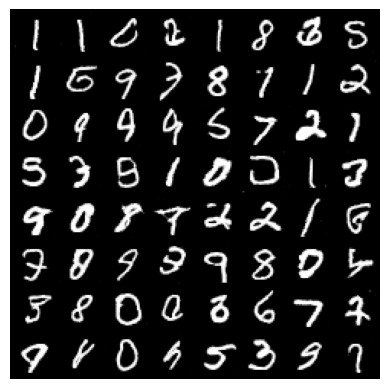

Epoch [57/100], Batch [100/938], D_real: 0.9306, D_fake: 0.1406, Loss_D: 0.2788, Loss_G: 4.2136
Epoch [57/100], Batch [200/938], D_real: 0.8998, D_fake: 0.0627, Loss_D: 0.1898, Loss_G: 3.4636
Epoch [57/100], Batch [300/938], D_real: 0.9280, D_fake: 0.0516, Loss_D: 0.1396, Loss_G: 3.7425
Epoch [57/100], Batch [400/938], D_real: 0.9905, D_fake: 0.2068, Loss_D: 0.3043, Loss_G: 3.3556
Epoch [57/100], Batch [500/938], D_real: 0.9080, D_fake: 0.0394, Loss_D: 0.1617, Loss_G: 4.7286
Epoch [57/100], Batch [600/938], D_real: 0.9759, D_fake: 0.1480, Loss_D: 0.2921, Loss_G: 4.2909
Epoch [57/100], Batch [700/938], D_real: 0.9899, D_fake: 0.3120, Loss_D: 0.5528, Loss_G: 4.2084
Epoch [57/100], Batch [800/938], D_real: 0.9460, D_fake: 0.0534, Loss_D: 0.1555, Loss_G: 5.7940
Epoch [57/100], Batch [900/938], D_real: 0.9629, D_fake: 0.0816, Loss_D: 0.1357, Loss_G: 3.4135


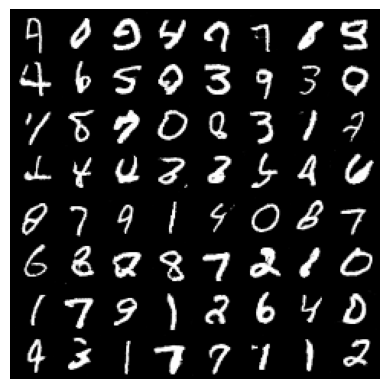

Epoch [58/100], Batch [100/938], D_real: 0.9382, D_fake: 0.0925, Loss_D: 0.2019, Loss_G: 3.7640
Epoch [58/100], Batch [200/938], D_real: 0.9712, D_fake: 0.1520, Loss_D: 0.2559, Loss_G: 3.5717
Epoch [58/100], Batch [300/938], D_real: 0.9267, D_fake: 0.0298, Loss_D: 0.1213, Loss_G: 4.9697
Epoch [58/100], Batch [400/938], D_real: 0.9034, D_fake: 0.0902, Loss_D: 0.2276, Loss_G: 2.4411
Epoch [58/100], Batch [500/938], D_real: 0.9320, D_fake: 0.1006, Loss_D: 0.2073, Loss_G: 4.0745
Epoch [58/100], Batch [600/938], D_real: 0.6790, D_fake: 0.0061, Loss_D: 0.5071, Loss_G: 6.9968
Epoch [58/100], Batch [700/938], D_real: 0.8634, D_fake: 0.0105, Loss_D: 0.2069, Loss_G: 5.6089
Epoch [58/100], Batch [800/938], D_real: 0.9784, D_fake: 0.1588, Loss_D: 0.2399, Loss_G: 4.4564
Epoch [58/100], Batch [900/938], D_real: 0.8443, D_fake: 0.0049, Loss_D: 0.2044, Loss_G: 5.7913


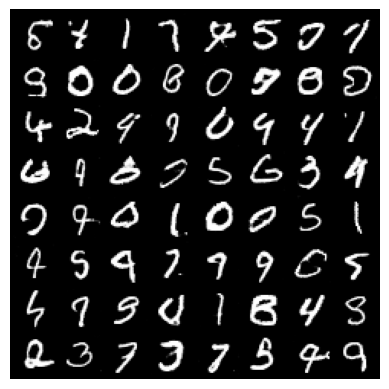

Epoch [59/100], Batch [100/938], D_real: 0.9717, D_fake: 0.1392, Loss_D: 0.2306, Loss_G: 3.8743
Epoch [59/100], Batch [200/938], D_real: 0.8628, D_fake: 0.1232, Loss_D: 0.3518, Loss_G: 3.4362
Epoch [59/100], Batch [300/938], D_real: 0.9514, D_fake: 0.1186, Loss_D: 0.2177, Loss_G: 3.7095
Epoch [59/100], Batch [400/938], D_real: 0.9867, D_fake: 0.2347, Loss_D: 0.4120, Loss_G: 4.2764
Epoch [59/100], Batch [500/938], D_real: 0.9374, D_fake: 0.0220, Loss_D: 0.0933, Loss_G: 4.7777
Epoch [59/100], Batch [600/938], D_real: 0.9552, D_fake: 0.1566, Loss_D: 0.2509, Loss_G: 2.8221
Epoch [59/100], Batch [700/938], D_real: 0.9926, D_fake: 0.2573, Loss_D: 0.4417, Loss_G: 2.1739
Epoch [59/100], Batch [800/938], D_real: 0.9506, D_fake: 0.0365, Loss_D: 0.0935, Loss_G: 4.2736
Epoch [59/100], Batch [900/938], D_real: 0.9917, D_fake: 0.2471, Loss_D: 0.4077, Loss_G: 4.5231


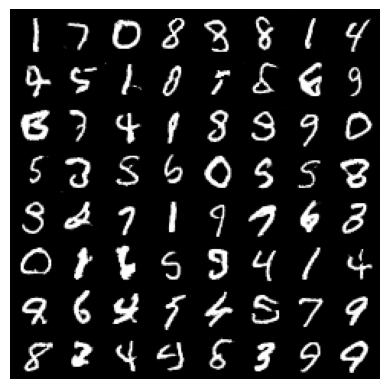

Epoch [60/100], Batch [100/938], D_real: 0.9804, D_fake: 0.1061, Loss_D: 0.1656, Loss_G: 3.7709
Epoch [60/100], Batch [200/938], D_real: 0.9456, D_fake: 0.0448, Loss_D: 0.1105, Loss_G: 4.7907
Epoch [60/100], Batch [300/938], D_real: 0.9812, D_fake: 0.1916, Loss_D: 0.2988, Loss_G: 3.5696
Epoch [60/100], Batch [400/938], D_real: 0.8163, D_fake: 0.0207, Loss_D: 0.2539, Loss_G: 6.0219
Epoch [60/100], Batch [500/938], D_real: 0.8967, D_fake: 0.0876, Loss_D: 0.2653, Loss_G: 4.8501
Epoch [60/100], Batch [600/938], D_real: 0.9733, D_fake: 0.1281, Loss_D: 0.1967, Loss_G: 4.4171
Epoch [60/100], Batch [700/938], D_real: 0.6993, D_fake: 0.0593, Loss_D: 0.5272, Loss_G: 3.7887
Epoch [60/100], Batch [800/938], D_real: 0.9001, D_fake: 0.0553, Loss_D: 0.1867, Loss_G: 4.3440
Epoch [60/100], Batch [900/938], D_real: 0.9641, D_fake: 0.0474, Loss_D: 0.0917, Loss_G: 4.1334


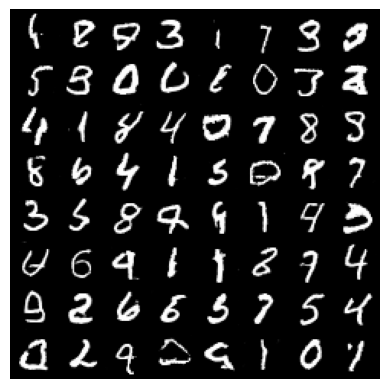

Epoch [61/100], Batch [100/938], D_real: 0.9699, D_fake: 0.0253, Loss_D: 0.0589, Loss_G: 4.9328
Epoch [61/100], Batch [200/938], D_real: 0.9836, D_fake: 0.0993, Loss_D: 0.1407, Loss_G: 3.5509
Epoch [61/100], Batch [300/938], D_real: 0.9926, D_fake: 0.2741, Loss_D: 0.5145, Loss_G: 2.2478
Epoch [61/100], Batch [400/938], D_real: 0.7871, D_fake: 0.0543, Loss_D: 0.3681, Loss_G: 5.4397
Epoch [61/100], Batch [500/938], D_real: 0.9624, D_fake: 0.0797, Loss_D: 0.1424, Loss_G: 3.0185
Epoch [61/100], Batch [600/938], D_real: 0.9321, D_fake: 0.1326, Loss_D: 0.2440, Loss_G: 2.7226
Epoch [61/100], Batch [700/938], D_real: 0.9871, D_fake: 0.1396, Loss_D: 0.2013, Loss_G: 5.2533
Epoch [61/100], Batch [800/938], D_real: 0.7906, D_fake: 0.0051, Loss_D: 0.2893, Loss_G: 6.6916
Epoch [61/100], Batch [900/938], D_real: 0.9553, D_fake: 0.0399, Loss_D: 0.0948, Loss_G: 4.2962


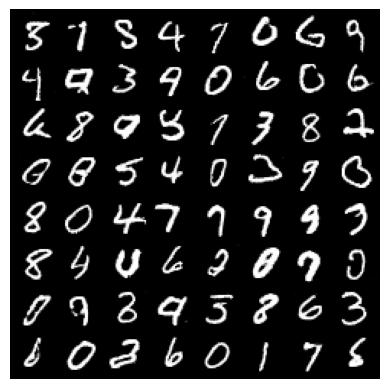

Epoch [62/100], Batch [100/938], D_real: 0.8857, D_fake: 0.0427, Loss_D: 0.2026, Loss_G: 5.2527
Epoch [62/100], Batch [200/938], D_real: 0.9748, D_fake: 0.0256, Loss_D: 0.0541, Loss_G: 4.3512
Epoch [62/100], Batch [300/938], D_real: 0.8443, D_fake: 0.0261, Loss_D: 0.2339, Loss_G: 5.5065
Epoch [62/100], Batch [400/938], D_real: 0.7726, D_fake: 0.0805, Loss_D: 0.4572, Loss_G: 4.9137
Epoch [62/100], Batch [500/938], D_real: 0.9027, D_fake: 0.0527, Loss_D: 0.1840, Loss_G: 4.1635
Epoch [62/100], Batch [600/938], D_real: 0.9744, D_fake: 0.1487, Loss_D: 0.2242, Loss_G: 3.6522
Epoch [62/100], Batch [700/938], D_real: 0.9319, D_fake: 0.0591, Loss_D: 0.1626, Loss_G: 4.6827
Epoch [62/100], Batch [800/938], D_real: 0.9175, D_fake: 0.0547, Loss_D: 0.1669, Loss_G: 4.6044
Epoch [62/100], Batch [900/938], D_real: 0.7212, D_fake: 0.0203, Loss_D: 0.4807, Loss_G: 4.1158


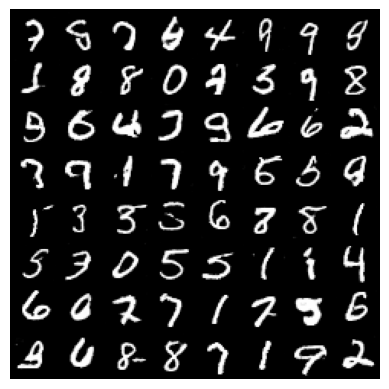

Epoch [63/100], Batch [100/938], D_real: 0.9867, D_fake: 0.2221, Loss_D: 0.4004, Loss_G: 3.9352
Epoch [63/100], Batch [200/938], D_real: 0.9894, D_fake: 0.1490, Loss_D: 0.2083, Loss_G: 4.0094
Epoch [63/100], Batch [300/938], D_real: 0.9338, D_fake: 0.0401, Loss_D: 0.1192, Loss_G: 4.9974
Epoch [63/100], Batch [400/938], D_real: 0.9802, D_fake: 0.1079, Loss_D: 0.1667, Loss_G: 4.5790
Epoch [63/100], Batch [500/938], D_real: 0.9337, D_fake: 0.1303, Loss_D: 0.2877, Loss_G: 3.1586
Epoch [63/100], Batch [600/938], D_real: 0.5122, D_fake: 0.0113, Loss_D: 1.0794, Loss_G: 3.7647
Epoch [63/100], Batch [700/938], D_real: 0.9047, D_fake: 0.0824, Loss_D: 0.2417, Loss_G: 3.7648
Epoch [63/100], Batch [800/938], D_real: 0.9935, D_fake: 0.0868, Loss_D: 0.1146, Loss_G: 3.9088
Epoch [63/100], Batch [900/938], D_real: 0.7041, D_fake: 0.0260, Loss_D: 0.4533, Loss_G: 4.0632


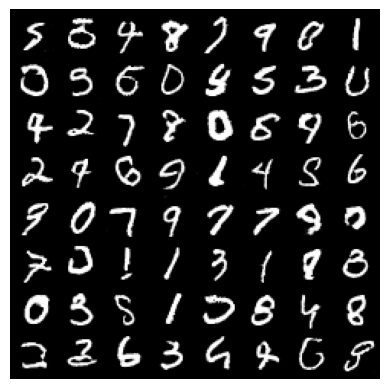

Epoch [64/100], Batch [100/938], D_real: 0.9873, D_fake: 0.2383, Loss_D: 0.3682, Loss_G: 3.7965
Epoch [64/100], Batch [200/938], D_real: 0.9812, D_fake: 0.0292, Loss_D: 0.0508, Loss_G: 5.2822
Epoch [64/100], Batch [300/938], D_real: 0.9633, D_fake: 0.2337, Loss_D: 0.4011, Loss_G: 3.9894
Epoch [64/100], Batch [400/938], D_real: 0.8876, D_fake: 0.0390, Loss_D: 0.1875, Loss_G: 5.0530
Epoch [64/100], Batch [500/938], D_real: 0.9543, D_fake: 0.0859, Loss_D: 0.1669, Loss_G: 3.8229
Epoch [64/100], Batch [600/938], D_real: 0.7832, D_fake: 0.0234, Loss_D: 0.3406, Loss_G: 5.5521
Epoch [64/100], Batch [700/938], D_real: 0.9436, D_fake: 0.0563, Loss_D: 0.1373, Loss_G: 4.3518
Epoch [64/100], Batch [800/938], D_real: 0.9019, D_fake: 0.0511, Loss_D: 0.1963, Loss_G: 5.5575
Epoch [64/100], Batch [900/938], D_real: 0.9393, D_fake: 0.0410, Loss_D: 0.1200, Loss_G: 4.6634


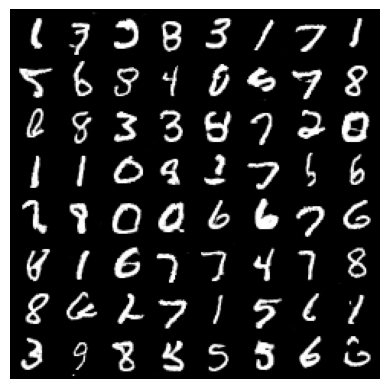

Epoch [65/100], Batch [100/938], D_real: 0.9696, D_fake: 0.0918, Loss_D: 0.1585, Loss_G: 5.2382
Epoch [65/100], Batch [200/938], D_real: 0.8787, D_fake: 0.0640, Loss_D: 0.2417, Loss_G: 3.8852
Epoch [65/100], Batch [300/938], D_real: 0.9576, D_fake: 0.0939, Loss_D: 0.1688, Loss_G: 3.2084
Epoch [65/100], Batch [400/938], D_real: 0.8072, D_fake: 0.0220, Loss_D: 0.2809, Loss_G: 4.9992
Epoch [65/100], Batch [500/938], D_real: 0.8902, D_fake: 0.1561, Loss_D: 0.4118, Loss_G: 2.7669
Epoch [65/100], Batch [600/938], D_real: 0.9733, D_fake: 0.1681, Loss_D: 0.3015, Loss_G: 4.5978
Epoch [65/100], Batch [700/938], D_real: 0.9370, D_fake: 0.0409, Loss_D: 0.1203, Loss_G: 4.8373
Epoch [65/100], Batch [800/938], D_real: 0.9344, D_fake: 0.0634, Loss_D: 0.1859, Loss_G: 4.5289
Epoch [65/100], Batch [900/938], D_real: 0.6266, D_fake: 0.0034, Loss_D: 0.6575, Loss_G: 6.2489


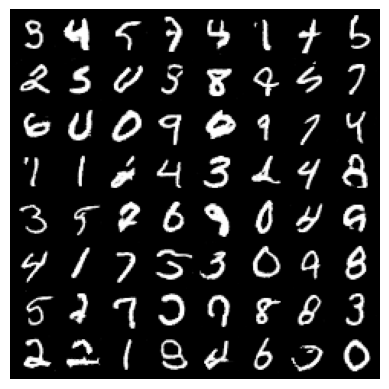

Epoch [66/100], Batch [100/938], D_real: 0.8860, D_fake: 0.0934, Loss_D: 0.3512, Loss_G: 3.2115
Epoch [66/100], Batch [200/938], D_real: 0.9577, D_fake: 0.0942, Loss_D: 0.1556, Loss_G: 4.6827
Epoch [66/100], Batch [300/938], D_real: 0.9434, D_fake: 0.0299, Loss_D: 0.0955, Loss_G: 5.6127
Epoch [66/100], Batch [400/938], D_real: 0.9429, D_fake: 0.0356, Loss_D: 0.1016, Loss_G: 4.8396
Epoch [66/100], Batch [500/938], D_real: 0.9411, D_fake: 0.0166, Loss_D: 0.0860, Loss_G: 5.8002
Epoch [66/100], Batch [600/938], D_real: 0.9919, D_fake: 0.1944, Loss_D: 0.3210, Loss_G: 4.7719
Epoch [66/100], Batch [700/938], D_real: 0.7126, D_fake: 0.0126, Loss_D: 0.4697, Loss_G: 4.9200
Epoch [66/100], Batch [800/938], D_real: 0.9647, D_fake: 0.0423, Loss_D: 0.0867, Loss_G: 5.8349
Epoch [66/100], Batch [900/938], D_real: 0.9514, D_fake: 0.0262, Loss_D: 0.0857, Loss_G: 4.9855


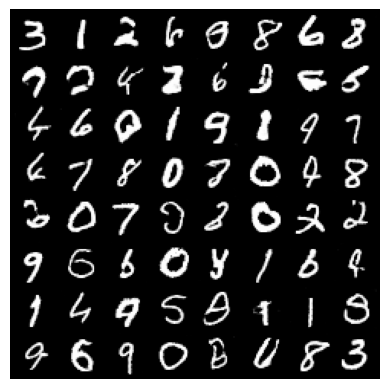

Epoch [67/100], Batch [100/938], D_real: 0.9007, D_fake: 0.0730, Loss_D: 0.1996, Loss_G: 4.4153
Epoch [67/100], Batch [200/938], D_real: 0.9588, D_fake: 0.0349, Loss_D: 0.0853, Loss_G: 4.5121
Epoch [67/100], Batch [300/938], D_real: 0.5350, D_fake: 0.0037, Loss_D: 0.9149, Loss_G: 3.5571
Epoch [67/100], Batch [400/938], D_real: 0.9742, D_fake: 0.0893, Loss_D: 0.1549, Loss_G: 4.5578
Epoch [67/100], Batch [500/938], D_real: 0.9279, D_fake: 0.0230, Loss_D: 0.1047, Loss_G: 6.2420
Epoch [67/100], Batch [600/938], D_real: 0.8868, D_fake: 0.0788, Loss_D: 0.2709, Loss_G: 2.9562
Epoch [67/100], Batch [700/938], D_real: 0.9779, D_fake: 0.2580, Loss_D: 0.4445, Loss_G: 2.9082
Epoch [67/100], Batch [800/938], D_real: 0.9968, D_fake: 0.3333, Loss_D: 0.6396, Loss_G: 3.7192
Epoch [67/100], Batch [900/938], D_real: 0.9408, D_fake: 0.0425, Loss_D: 0.1257, Loss_G: 5.5457


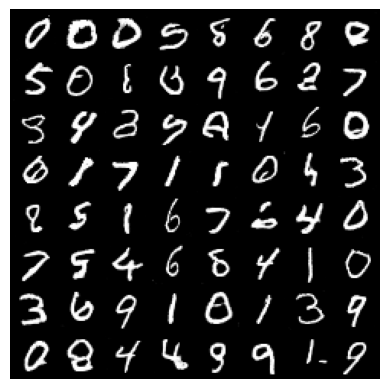

Epoch [68/100], Batch [100/938], D_real: 0.8808, D_fake: 0.0395, Loss_D: 0.1832, Loss_G: 4.7151
Epoch [68/100], Batch [200/938], D_real: 0.9427, D_fake: 0.0701, Loss_D: 0.1551, Loss_G: 4.1171
Epoch [68/100], Batch [300/938], D_real: 0.9780, D_fake: 0.1045, Loss_D: 0.1522, Loss_G: 3.8159
Epoch [68/100], Batch [400/938], D_real: 0.9798, D_fake: 0.1112, Loss_D: 0.1778, Loss_G: 3.3185
Epoch [68/100], Batch [500/938], D_real: 0.8631, D_fake: 0.0026, Loss_D: 0.1743, Loss_G: 8.2869
Epoch [68/100], Batch [600/938], D_real: 0.9831, D_fake: 0.1300, Loss_D: 0.1791, Loss_G: 4.2546
Epoch [68/100], Batch [700/938], D_real: 0.9520, D_fake: 0.1767, Loss_D: 0.3538, Loss_G: 3.7246
Epoch [68/100], Batch [800/938], D_real: 0.9387, D_fake: 0.0644, Loss_D: 0.1526, Loss_G: 4.3309
Epoch [68/100], Batch [900/938], D_real: 0.9410, D_fake: 0.0339, Loss_D: 0.1068, Loss_G: 5.7799


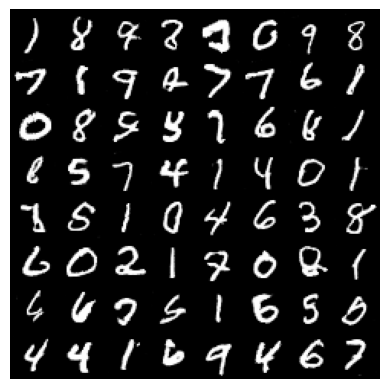

Epoch [69/100], Batch [100/938], D_real: 0.9841, D_fake: 0.1268, Loss_D: 0.1894, Loss_G: 3.9953
Epoch [69/100], Batch [200/938], D_real: 0.9595, D_fake: 0.0446, Loss_D: 0.0934, Loss_G: 4.3361
Epoch [69/100], Batch [300/938], D_real: 0.9154, D_fake: 0.0685, Loss_D: 0.1860, Loss_G: 4.0565
Epoch [69/100], Batch [400/938], D_real: 0.9978, D_fake: 0.2495, Loss_D: 0.4337, Loss_G: 2.4421
Epoch [69/100], Batch [500/938], D_real: 0.9070, D_fake: 0.0950, Loss_D: 0.2577, Loss_G: 3.5979
Epoch [69/100], Batch [600/938], D_real: 0.9791, D_fake: 0.0977, Loss_D: 0.1434, Loss_G: 4.5100
Epoch [69/100], Batch [700/938], D_real: 0.6787, D_fake: 0.0048, Loss_D: 0.5613, Loss_G: 6.3803
Epoch [69/100], Batch [800/938], D_real: 0.9166, D_fake: 0.0549, Loss_D: 0.1635, Loss_G: 4.1236
Epoch [69/100], Batch [900/938], D_real: 0.9795, D_fake: 0.0988, Loss_D: 0.1459, Loss_G: 4.2823


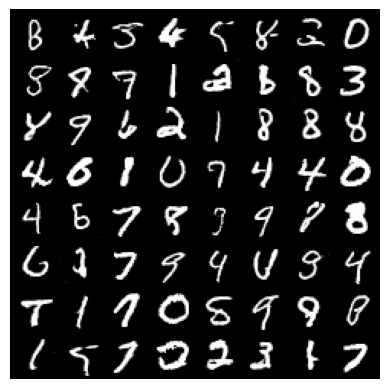

Epoch [70/100], Batch [100/938], D_real: 0.9793, D_fake: 0.0739, Loss_D: 0.1319, Loss_G: 4.6576
Epoch [70/100], Batch [200/938], D_real: 0.9159, D_fake: 0.2602, Loss_D: 0.5489, Loss_G: 2.7384
Epoch [70/100], Batch [300/938], D_real: 0.9951, D_fake: 0.1544, Loss_D: 0.2035, Loss_G: 3.3996
Epoch [70/100], Batch [400/938], D_real: 0.9866, D_fake: 0.0633, Loss_D: 0.0896, Loss_G: 4.5271
Epoch [70/100], Batch [500/938], D_real: 0.9002, D_fake: 0.0351, Loss_D: 0.1642, Loss_G: 4.6109
Epoch [70/100], Batch [600/938], D_real: 0.9889, D_fake: 0.2167, Loss_D: 0.3868, Loss_G: 3.8244
Epoch [70/100], Batch [700/938], D_real: 0.9301, D_fake: 0.1020, Loss_D: 0.2063, Loss_G: 3.2951
Epoch [70/100], Batch [800/938], D_real: 0.9603, D_fake: 0.0434, Loss_D: 0.0967, Loss_G: 4.9508
Epoch [70/100], Batch [900/938], D_real: 0.9615, D_fake: 0.0585, Loss_D: 0.1205, Loss_G: 4.1681


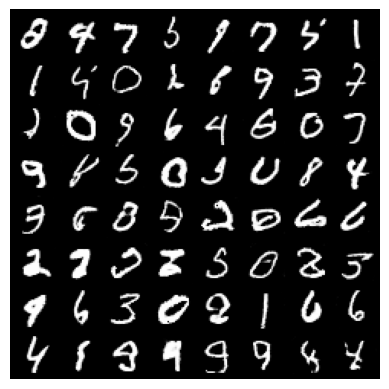

Epoch [71/100], Batch [100/938], D_real: 0.8689, D_fake: 0.0258, Loss_D: 0.1915, Loss_G: 4.9953
Epoch [71/100], Batch [200/938], D_real: 0.9928, D_fake: 0.4420, Loss_D: 0.9617, Loss_G: 2.3783
Epoch [71/100], Batch [300/938], D_real: 0.8925, D_fake: 0.0132, Loss_D: 0.1597, Loss_G: 5.6669
Epoch [71/100], Batch [400/938], D_real: 0.8907, D_fake: 0.0378, Loss_D: 0.1774, Loss_G: 4.0117
Epoch [71/100], Batch [500/938], D_real: 0.7776, D_fake: 0.0188, Loss_D: 0.3336, Loss_G: 5.6266
Epoch [71/100], Batch [600/938], D_real: 0.9335, D_fake: 0.1364, Loss_D: 0.2843, Loss_G: 3.9396
Epoch [71/100], Batch [700/938], D_real: 0.9696, D_fake: 0.0866, Loss_D: 0.1467, Loss_G: 4.8654
Epoch [71/100], Batch [800/938], D_real: 0.9105, D_fake: 0.0413, Loss_D: 0.2183, Loss_G: 4.2791
Epoch [71/100], Batch [900/938], D_real: 0.9644, D_fake: 0.0344, Loss_D: 0.0792, Loss_G: 5.8307


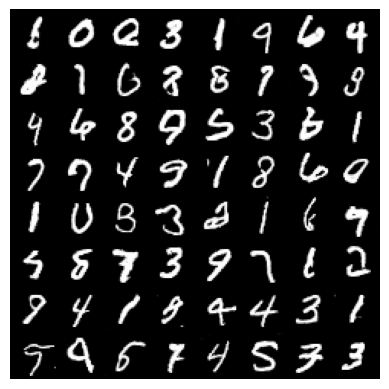

Epoch [72/100], Batch [100/938], D_real: 0.9330, D_fake: 0.0425, Loss_D: 0.1276, Loss_G: 3.7752
Epoch [72/100], Batch [200/938], D_real: 0.9461, D_fake: 0.1566, Loss_D: 0.2913, Loss_G: 3.0219
Epoch [72/100], Batch [300/938], D_real: 0.9155, D_fake: 0.0314, Loss_D: 0.1320, Loss_G: 5.4101
Epoch [72/100], Batch [400/938], D_real: 0.9142, D_fake: 0.0578, Loss_D: 0.1962, Loss_G: 4.2619
Epoch [72/100], Batch [500/938], D_real: 0.9361, D_fake: 0.0546, Loss_D: 0.1544, Loss_G: 4.9939
Epoch [72/100], Batch [600/938], D_real: 0.9715, D_fake: 0.0549, Loss_D: 0.1023, Loss_G: 5.2545
Epoch [72/100], Batch [700/938], D_real: 0.9176, D_fake: 0.1237, Loss_D: 0.2577, Loss_G: 3.3377
Epoch [72/100], Batch [800/938], D_real: 0.7785, D_fake: 0.0101, Loss_D: 0.3661, Loss_G: 6.7598
Epoch [72/100], Batch [900/938], D_real: 0.9544, D_fake: 0.0507, Loss_D: 0.1136, Loss_G: 5.0987


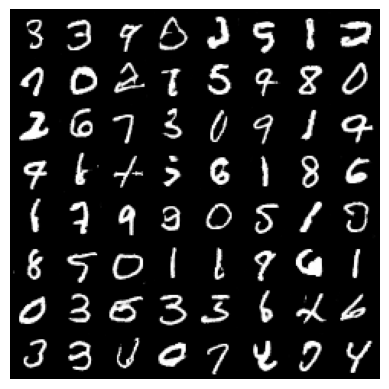

Epoch [73/100], Batch [100/938], D_real: 0.8573, D_fake: 0.0460, Loss_D: 0.2500, Loss_G: 4.7483
Epoch [73/100], Batch [200/938], D_real: 0.8013, D_fake: 0.0176, Loss_D: 0.2788, Loss_G: 6.1961
Epoch [73/100], Batch [300/938], D_real: 0.8703, D_fake: 0.0504, Loss_D: 0.2181, Loss_G: 4.5470
Epoch [73/100], Batch [400/938], D_real: 0.9781, D_fake: 0.0770, Loss_D: 0.1207, Loss_G: 4.5660
Epoch [73/100], Batch [500/938], D_real: 0.9661, D_fake: 0.1323, Loss_D: 0.2313, Loss_G: 5.2384
Epoch [73/100], Batch [600/938], D_real: 0.9783, D_fake: 0.0683, Loss_D: 0.1089, Loss_G: 4.3248
Epoch [73/100], Batch [700/938], D_real: 0.9723, D_fake: 0.1129, Loss_D: 0.1911, Loss_G: 4.3222
Epoch [73/100], Batch [800/938], D_real: 0.9566, D_fake: 0.0718, Loss_D: 0.1470, Loss_G: 4.6693
Epoch [73/100], Batch [900/938], D_real: 0.9475, D_fake: 0.1744, Loss_D: 0.3065, Loss_G: 4.4706


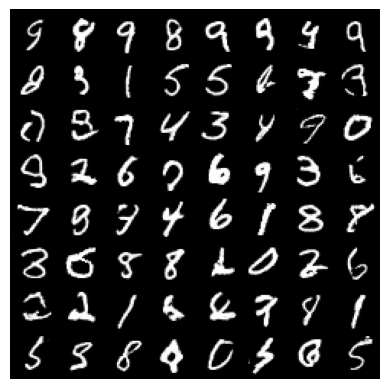

Epoch [74/100], Batch [100/938], D_real: 0.9348, D_fake: 0.0146, Loss_D: 0.0900, Loss_G: 6.2768
Epoch [74/100], Batch [200/938], D_real: 0.9154, D_fake: 0.0578, Loss_D: 0.2010, Loss_G: 3.8006
Epoch [74/100], Batch [300/938], D_real: 0.9935, D_fake: 0.2160, Loss_D: 0.3566, Loss_G: 3.1977
Epoch [74/100], Batch [400/938], D_real: 0.9722, D_fake: 0.1401, Loss_D: 0.2476, Loss_G: 3.5042
Epoch [74/100], Batch [500/938], D_real: 0.9856, D_fake: 0.0655, Loss_D: 0.0903, Loss_G: 4.3741
Epoch [74/100], Batch [600/938], D_real: 0.9304, D_fake: 0.0481, Loss_D: 0.1461, Loss_G: 5.0516
Epoch [74/100], Batch [700/938], D_real: 0.9347, D_fake: 0.0621, Loss_D: 0.1692, Loss_G: 4.1271
Epoch [74/100], Batch [800/938], D_real: 0.7955, D_fake: 0.0087, Loss_D: 0.2906, Loss_G: 6.4099
Epoch [74/100], Batch [900/938], D_real: 0.9886, D_fake: 0.0911, Loss_D: 0.1319, Loss_G: 4.5470


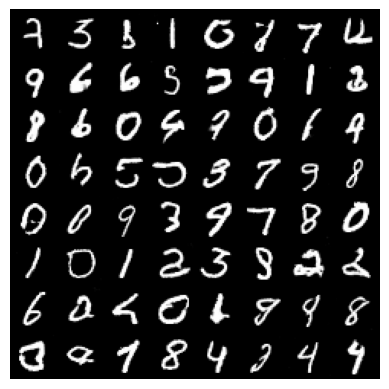

Epoch [75/100], Batch [100/938], D_real: 0.9936, D_fake: 0.1273, Loss_D: 0.1916, Loss_G: 2.5660
Epoch [75/100], Batch [200/938], D_real: 0.9825, D_fake: 0.2125, Loss_D: 0.3414, Loss_G: 3.0018
Epoch [75/100], Batch [300/938], D_real: 0.9697, D_fake: 0.0641, Loss_D: 0.1044, Loss_G: 3.7846
Epoch [75/100], Batch [400/938], D_real: 0.9681, D_fake: 0.0545, Loss_D: 0.0934, Loss_G: 4.8931
Epoch [75/100], Batch [500/938], D_real: 0.8557, D_fake: 0.0098, Loss_D: 0.2030, Loss_G: 6.5522
Epoch [75/100], Batch [600/938], D_real: 0.8539, D_fake: 0.0322, Loss_D: 0.2280, Loss_G: 5.6916
Epoch [75/100], Batch [700/938], D_real: 0.8828, D_fake: 0.0806, Loss_D: 0.2602, Loss_G: 4.3561
Epoch [75/100], Batch [800/938], D_real: 0.9934, D_fake: 0.2391, Loss_D: 0.4462, Loss_G: 3.1208
Epoch [75/100], Batch [900/938], D_real: 0.9917, D_fake: 0.1672, Loss_D: 0.2681, Loss_G: 3.6132


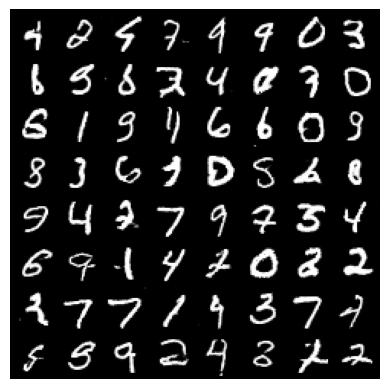

Epoch [76/100], Batch [100/938], D_real: 0.9425, D_fake: 0.0119, Loss_D: 0.0755, Loss_G: 5.7628
Epoch [76/100], Batch [200/938], D_real: 0.9239, D_fake: 0.0763, Loss_D: 0.1879, Loss_G: 3.6098
Epoch [76/100], Batch [300/938], D_real: 0.9082, D_fake: 0.0227, Loss_D: 0.1431, Loss_G: 5.5304
Epoch [76/100], Batch [400/938], D_real: 0.8623, D_fake: 0.0511, Loss_D: 0.2382, Loss_G: 5.8993
Epoch [76/100], Batch [500/938], D_real: 0.9420, D_fake: 0.0487, Loss_D: 0.1295, Loss_G: 4.8451
Epoch [76/100], Batch [600/938], D_real: 0.8736, D_fake: 0.0210, Loss_D: 0.1879, Loss_G: 5.0883
Epoch [76/100], Batch [700/938], D_real: 0.9911, D_fake: 0.1178, Loss_D: 0.1651, Loss_G: 4.3039
Epoch [76/100], Batch [800/938], D_real: 0.9539, D_fake: 0.0923, Loss_D: 0.1913, Loss_G: 3.7986
Epoch [76/100], Batch [900/938], D_real: 0.8838, D_fake: 0.0334, Loss_D: 0.1790, Loss_G: 5.0289


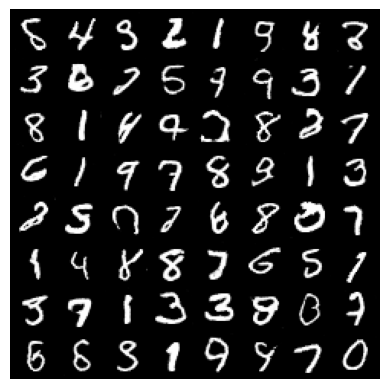

Epoch [77/100], Batch [100/938], D_real: 0.9601, D_fake: 0.1010, Loss_D: 0.1730, Loss_G: 3.3282
Epoch [77/100], Batch [200/938], D_real: 0.9093, D_fake: 0.0747, Loss_D: 0.2033, Loss_G: 4.4487
Epoch [77/100], Batch [300/938], D_real: 0.8521, D_fake: 0.0174, Loss_D: 0.2097, Loss_G: 5.9991
Epoch [77/100], Batch [400/938], D_real: 0.8931, D_fake: 0.0091, Loss_D: 0.1588, Loss_G: 6.3075
Epoch [77/100], Batch [500/938], D_real: 0.9319, D_fake: 0.1423, Loss_D: 0.2696, Loss_G: 3.4977
Epoch [77/100], Batch [600/938], D_real: 0.9408, D_fake: 0.0514, Loss_D: 0.1247, Loss_G: 6.0347
Epoch [77/100], Batch [700/938], D_real: 0.8984, D_fake: 0.0315, Loss_D: 0.1530, Loss_G: 5.7450
Epoch [77/100], Batch [800/938], D_real: 0.9460, D_fake: 0.0639, Loss_D: 0.1451, Loss_G: 6.0060
Epoch [77/100], Batch [900/938], D_real: 0.8624, D_fake: 0.0344, Loss_D: 0.2068, Loss_G: 6.4310


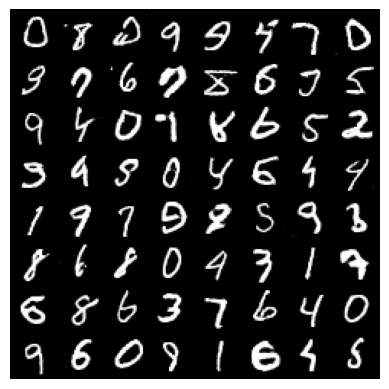

Epoch [78/100], Batch [100/938], D_real: 0.9250, D_fake: 0.0171, Loss_D: 0.1094, Loss_G: 5.3647
Epoch [78/100], Batch [200/938], D_real: 0.9226, D_fake: 0.0414, Loss_D: 0.1607, Loss_G: 5.9857
Epoch [78/100], Batch [300/938], D_real: 0.9890, D_fake: 0.1486, Loss_D: 0.2235, Loss_G: 2.5491
Epoch [78/100], Batch [400/938], D_real: 0.9474, D_fake: 0.0491, Loss_D: 0.1144, Loss_G: 4.1347
Epoch [78/100], Batch [500/938], D_real: 0.9561, D_fake: 0.0251, Loss_D: 0.0742, Loss_G: 4.4458
Epoch [78/100], Batch [600/938], D_real: 0.9767, D_fake: 0.0530, Loss_D: 0.1035, Loss_G: 6.2387
Epoch [78/100], Batch [700/938], D_real: 0.9833, D_fake: 0.2161, Loss_D: 0.4037, Loss_G: 3.7769
Epoch [78/100], Batch [800/938], D_real: 0.9465, D_fake: 0.2418, Loss_D: 0.5160, Loss_G: 4.1991
Epoch [78/100], Batch [900/938], D_real: 0.9408, D_fake: 0.0836, Loss_D: 0.1939, Loss_G: 4.5144


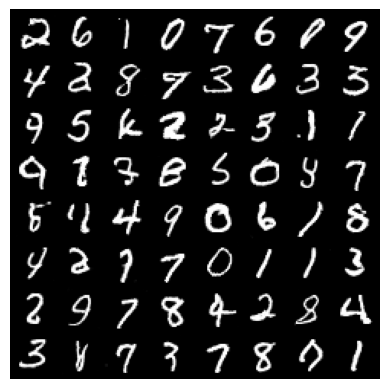

Epoch [79/100], Batch [100/938], D_real: 0.8171, D_fake: 0.0136, Loss_D: 0.2758, Loss_G: 5.9206
Epoch [79/100], Batch [200/938], D_real: 0.9069, D_fake: 0.0446, Loss_D: 0.1589, Loss_G: 5.0630
Epoch [79/100], Batch [300/938], D_real: 0.9836, D_fake: 0.0651, Loss_D: 0.0910, Loss_G: 5.2507
Epoch [79/100], Batch [400/938], D_real: 0.8131, D_fake: 0.0563, Loss_D: 0.3231, Loss_G: 4.3626
Epoch [79/100], Batch [500/938], D_real: 0.4902, D_fake: 0.0016, Loss_D: 1.1786, Loss_G: 6.6843
Epoch [79/100], Batch [600/938], D_real: 0.9680, D_fake: 0.0448, Loss_D: 0.0883, Loss_G: 5.6765
Epoch [79/100], Batch [700/938], D_real: 0.9598, D_fake: 0.0559, Loss_D: 0.1075, Loss_G: 3.9935
Epoch [79/100], Batch [800/938], D_real: 0.9915, D_fake: 0.0917, Loss_D: 0.1315, Loss_G: 4.1211
Epoch [79/100], Batch [900/938], D_real: 0.8937, D_fake: 0.0106, Loss_D: 0.1423, Loss_G: 6.2590


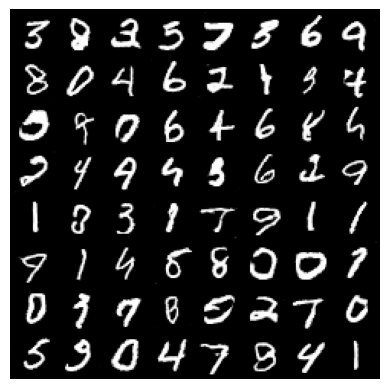

Epoch [80/100], Batch [100/938], D_real: 0.9206, D_fake: 0.0800, Loss_D: 0.2056, Loss_G: 4.1623
Epoch [80/100], Batch [200/938], D_real: 0.7679, D_fake: 0.0358, Loss_D: 0.3745, Loss_G: 3.2245
Epoch [80/100], Batch [300/938], D_real: 0.9967, D_fake: 0.2414, Loss_D: 0.3879, Loss_G: 3.9455
Epoch [80/100], Batch [400/938], D_real: 0.9735, D_fake: 0.1006, Loss_D: 0.1570, Loss_G: 4.2748
Epoch [80/100], Batch [500/938], D_real: 0.9687, D_fake: 0.0743, Loss_D: 0.1231, Loss_G: 5.7572
Epoch [80/100], Batch [600/938], D_real: 0.9694, D_fake: 0.1584, Loss_D: 0.2856, Loss_G: 4.6709
Epoch [80/100], Batch [700/938], D_real: 0.9809, D_fake: 0.1295, Loss_D: 0.2016, Loss_G: 3.9185
Epoch [80/100], Batch [800/938], D_real: 0.8731, D_fake: 0.0402, Loss_D: 0.2000, Loss_G: 4.6171
Epoch [80/100], Batch [900/938], D_real: 0.9944, D_fake: 0.0480, Loss_D: 0.0642, Loss_G: 5.2366


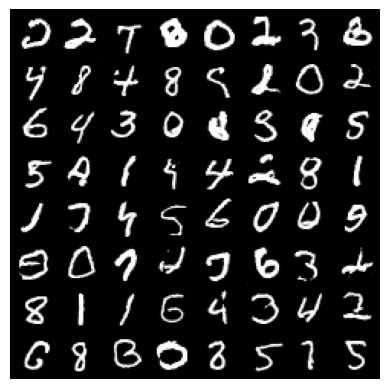

Epoch [81/100], Batch [100/938], D_real: 0.9759, D_fake: 0.0473, Loss_D: 0.0868, Loss_G: 5.0709
Epoch [81/100], Batch [200/938], D_real: 0.9528, D_fake: 0.0607, Loss_D: 0.1333, Loss_G: 4.2375
Epoch [81/100], Batch [300/938], D_real: 0.8766, D_fake: 0.0607, Loss_D: 0.2543, Loss_G: 5.4927
Epoch [81/100], Batch [400/938], D_real: 0.9623, D_fake: 0.0540, Loss_D: 0.1024, Loss_G: 5.1678
Epoch [81/100], Batch [500/938], D_real: 0.8052, D_fake: 0.0084, Loss_D: 0.2773, Loss_G: 5.8600
Epoch [81/100], Batch [600/938], D_real: 0.8791, D_fake: 0.0093, Loss_D: 0.1594, Loss_G: 5.4703
Epoch [81/100], Batch [700/938], D_real: 0.8030, D_fake: 0.0109, Loss_D: 0.2961, Loss_G: 7.2944
Epoch [81/100], Batch [800/938], D_real: 0.9505, D_fake: 0.0572, Loss_D: 0.1461, Loss_G: 4.6286
Epoch [81/100], Batch [900/938], D_real: 0.9054, D_fake: 0.0661, Loss_D: 0.2027, Loss_G: 4.3678


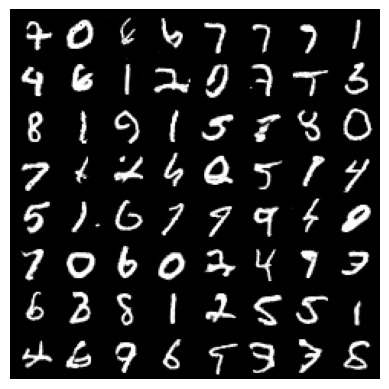

Epoch [82/100], Batch [100/938], D_real: 0.9883, D_fake: 0.1140, Loss_D: 0.1840, Loss_G: 3.8469
Epoch [82/100], Batch [200/938], D_real: 0.9722, D_fake: 0.0488, Loss_D: 0.0877, Loss_G: 5.5680
Epoch [82/100], Batch [300/938], D_real: 0.9731, D_fake: 0.0701, Loss_D: 0.1205, Loss_G: 4.2607
Epoch [82/100], Batch [400/938], D_real: 0.9291, D_fake: 0.0626, Loss_D: 0.1695, Loss_G: 5.0960
Epoch [82/100], Batch [500/938], D_real: 0.8891, D_fake: 0.0493, Loss_D: 0.2006, Loss_G: 4.8048
Epoch [82/100], Batch [600/938], D_real: 0.8288, D_fake: 0.0487, Loss_D: 0.2949, Loss_G: 5.0774
Epoch [82/100], Batch [700/938], D_real: 0.7287, D_fake: 0.0274, Loss_D: 0.4375, Loss_G: 4.5709
Epoch [82/100], Batch [800/938], D_real: 0.9599, D_fake: 0.0968, Loss_D: 0.1773, Loss_G: 4.9378
Epoch [82/100], Batch [900/938], D_real: 0.9646, D_fake: 0.1152, Loss_D: 0.1825, Loss_G: 4.4881


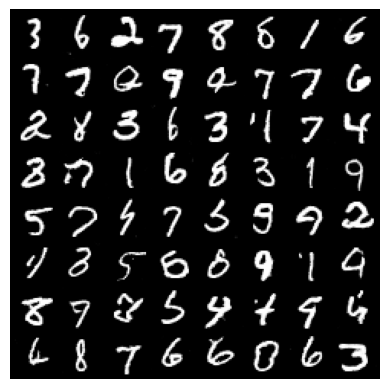

Epoch [83/100], Batch [100/938], D_real: 0.9841, D_fake: 0.1355, Loss_D: 0.2060, Loss_G: 4.0759
Epoch [83/100], Batch [200/938], D_real: 0.9743, D_fake: 0.0440, Loss_D: 0.0782, Loss_G: 4.5830
Epoch [83/100], Batch [300/938], D_real: 0.9839, D_fake: 0.2054, Loss_D: 0.3667, Loss_G: 3.0673
Epoch [83/100], Batch [400/938], D_real: 0.9403, D_fake: 0.0532, Loss_D: 0.1311, Loss_G: 3.7824
Epoch [83/100], Batch [500/938], D_real: 0.9977, D_fake: 0.1879, Loss_D: 0.3126, Loss_G: 3.4422
Epoch [83/100], Batch [600/938], D_real: 0.9583, D_fake: 0.1797, Loss_D: 0.2895, Loss_G: 3.2171
Epoch [83/100], Batch [700/938], D_real: 0.8472, D_fake: 0.0194, Loss_D: 0.2318, Loss_G: 4.8883
Epoch [83/100], Batch [800/938], D_real: 0.9958, D_fake: 0.2879, Loss_D: 0.4839, Loss_G: 6.2394
Epoch [83/100], Batch [900/938], D_real: 0.9718, D_fake: 0.0752, Loss_D: 0.1234, Loss_G: 4.2924


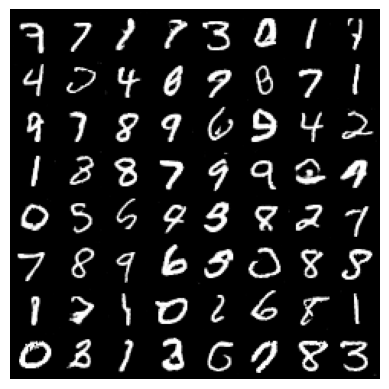

Epoch [84/100], Batch [100/938], D_real: 0.9549, D_fake: 0.0431, Loss_D: 0.1042, Loss_G: 5.4500
Epoch [84/100], Batch [200/938], D_real: 0.9783, D_fake: 0.0662, Loss_D: 0.1037, Loss_G: 3.7068
Epoch [84/100], Batch [300/938], D_real: 0.9683, D_fake: 0.0481, Loss_D: 0.0888, Loss_G: 4.7391
Epoch [84/100], Batch [400/938], D_real: 0.9463, D_fake: 0.0674, Loss_D: 0.1751, Loss_G: 4.6581
Epoch [84/100], Batch [500/938], D_real: 0.9190, D_fake: 0.0261, Loss_D: 0.1199, Loss_G: 4.3624
Epoch [84/100], Batch [600/938], D_real: 0.9399, D_fake: 0.0962, Loss_D: 0.2170, Loss_G: 3.9489
Epoch [84/100], Batch [700/938], D_real: 0.9374, D_fake: 0.0492, Loss_D: 0.1533, Loss_G: 4.7962
Epoch [84/100], Batch [800/938], D_real: 0.9594, D_fake: 0.0249, Loss_D: 0.0714, Loss_G: 5.3491
Epoch [84/100], Batch [900/938], D_real: 0.9406, D_fake: 0.0632, Loss_D: 0.1381, Loss_G: 4.6578


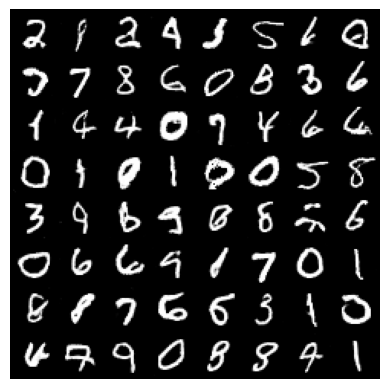

Epoch [85/100], Batch [100/938], D_real: 0.8389, D_fake: 0.0494, Loss_D: 0.2856, Loss_G: 4.2265
Epoch [85/100], Batch [200/938], D_real: 0.8731, D_fake: 0.0340, Loss_D: 0.1861, Loss_G: 5.3047
Epoch [85/100], Batch [300/938], D_real: 0.8886, D_fake: 0.0206, Loss_D: 0.1575, Loss_G: 5.8227
Epoch [85/100], Batch [400/938], D_real: 0.9732, D_fake: 0.0213, Loss_D: 0.0516, Loss_G: 4.6920
Epoch [85/100], Batch [500/938], D_real: 0.9781, D_fake: 0.1203, Loss_D: 0.1905, Loss_G: 3.6575
Epoch [85/100], Batch [600/938], D_real: 0.9927, D_fake: 0.1031, Loss_D: 0.1636, Loss_G: 5.2404
Epoch [85/100], Batch [700/938], D_real: 0.9788, D_fake: 0.2136, Loss_D: 0.4012, Loss_G: 3.9303
Epoch [85/100], Batch [800/938], D_real: 0.8609, D_fake: 0.0310, Loss_D: 0.2047, Loss_G: 4.6522
Epoch [85/100], Batch [900/938], D_real: 0.8820, D_fake: 0.0208, Loss_D: 0.1779, Loss_G: 5.6719


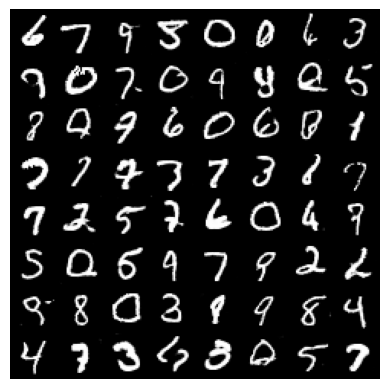

Epoch [86/100], Batch [100/938], D_real: 0.9477, D_fake: 0.0551, Loss_D: 0.1257, Loss_G: 5.3520
Epoch [86/100], Batch [200/938], D_real: 0.9180, D_fake: 0.0433, Loss_D: 0.1460, Loss_G: 4.9441
Epoch [86/100], Batch [300/938], D_real: 0.9298, D_fake: 0.1272, Loss_D: 0.2803, Loss_G: 3.0378
Epoch [86/100], Batch [400/938], D_real: 0.9931, D_fake: 0.1814, Loss_D: 0.2936, Loss_G: 3.4950
Epoch [86/100], Batch [500/938], D_real: 0.9590, D_fake: 0.2153, Loss_D: 0.3937, Loss_G: 3.4520
Epoch [86/100], Batch [600/938], D_real: 0.8934, D_fake: 0.1130, Loss_D: 0.3230, Loss_G: 2.9360
Epoch [86/100], Batch [700/938], D_real: 0.8818, D_fake: 0.0155, Loss_D: 0.1810, Loss_G: 4.9884
Epoch [86/100], Batch [800/938], D_real: 0.9656, D_fake: 0.0517, Loss_D: 0.1028, Loss_G: 3.4800
Epoch [86/100], Batch [900/938], D_real: 0.9775, D_fake: 0.0594, Loss_D: 0.0927, Loss_G: 4.6672


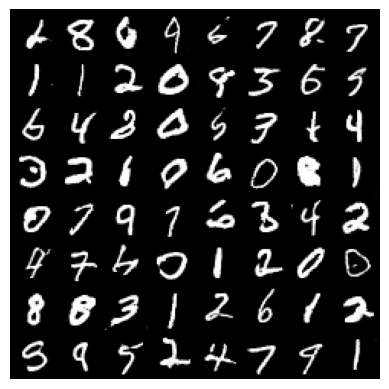

Epoch [87/100], Batch [100/938], D_real: 0.9322, D_fake: 0.0219, Loss_D: 0.1002, Loss_G: 5.6297
Epoch [87/100], Batch [200/938], D_real: 0.9191, D_fake: 0.0180, Loss_D: 0.1184, Loss_G: 5.8166
Epoch [87/100], Batch [300/938], D_real: 0.9829, D_fake: 0.1317, Loss_D: 0.2223, Loss_G: 3.9635
Epoch [87/100], Batch [400/938], D_real: 0.8675, D_fake: 0.0069, Loss_D: 0.1708, Loss_G: 5.5086
Epoch [87/100], Batch [500/938], D_real: 0.9781, D_fake: 0.0766, Loss_D: 0.1207, Loss_G: 5.2476
Epoch [87/100], Batch [600/938], D_real: 0.9551, D_fake: 0.0414, Loss_D: 0.0942, Loss_G: 5.4669
Epoch [87/100], Batch [700/938], D_real: 0.9047, D_fake: 0.0225, Loss_D: 0.1408, Loss_G: 4.6694
Epoch [87/100], Batch [800/938], D_real: 0.6757, D_fake: 0.0046, Loss_D: 0.6001, Loss_G: 7.4619
Epoch [87/100], Batch [900/938], D_real: 0.8918, D_fake: 0.0661, Loss_D: 0.2276, Loss_G: 3.4643


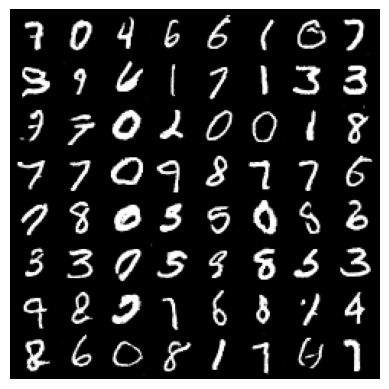

Epoch [88/100], Batch [100/938], D_real: 0.9659, D_fake: 0.0179, Loss_D: 0.0578, Loss_G: 5.5280
Epoch [88/100], Batch [200/938], D_real: 0.8135, D_fake: 0.0080, Loss_D: 0.2439, Loss_G: 4.7155
Epoch [88/100], Batch [300/938], D_real: 0.9030, D_fake: 0.0247, Loss_D: 0.1425, Loss_G: 4.9438
Epoch [88/100], Batch [400/938], D_real: 0.8818, D_fake: 0.0277, Loss_D: 0.1833, Loss_G: 5.1277
Epoch [88/100], Batch [500/938], D_real: 0.8288, D_fake: 0.0199, Loss_D: 0.2384, Loss_G: 6.4841
Epoch [88/100], Batch [600/938], D_real: 0.9292, D_fake: 0.0671, Loss_D: 0.1772, Loss_G: 5.0622
Epoch [88/100], Batch [700/938], D_real: 0.9910, D_fake: 0.1249, Loss_D: 0.1892, Loss_G: 3.1495
Epoch [88/100], Batch [800/938], D_real: 0.9773, D_fake: 0.1443, Loss_D: 0.2100, Loss_G: 4.5383
Epoch [88/100], Batch [900/938], D_real: 0.9919, D_fake: 0.1288, Loss_D: 0.1962, Loss_G: 3.3774


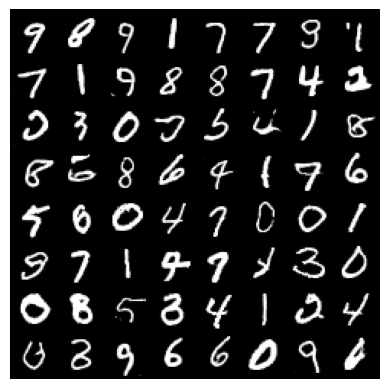

Epoch [89/100], Batch [100/938], D_real: 0.9377, D_fake: 0.0628, Loss_D: 0.1387, Loss_G: 4.1739
Epoch [89/100], Batch [200/938], D_real: 0.9529, D_fake: 0.1701, Loss_D: 0.3390, Loss_G: 2.3902
Epoch [89/100], Batch [300/938], D_real: 0.7772, D_fake: 0.0431, Loss_D: 0.3916, Loss_G: 5.7633
Epoch [89/100], Batch [400/938], D_real: 0.9850, D_fake: 0.0301, Loss_D: 0.0498, Loss_G: 4.0173
Epoch [89/100], Batch [500/938], D_real: 0.9629, D_fake: 0.1030, Loss_D: 0.1970, Loss_G: 4.7573
Epoch [89/100], Batch [600/938], D_real: 0.9626, D_fake: 0.1372, Loss_D: 0.2399, Loss_G: 4.0889
Epoch [89/100], Batch [700/938], D_real: 0.9708, D_fake: 0.1747, Loss_D: 0.2991, Loss_G: 3.3963
Epoch [89/100], Batch [800/938], D_real: 0.9349, D_fake: 0.0894, Loss_D: 0.1958, Loss_G: 6.5077
Epoch [89/100], Batch [900/938], D_real: 0.9756, D_fake: 0.0500, Loss_D: 0.0806, Loss_G: 3.6064


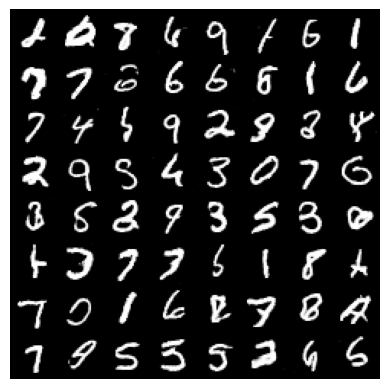

Epoch [90/100], Batch [100/938], D_real: 0.9624, D_fake: 0.1670, Loss_D: 0.2854, Loss_G: 2.8880
Epoch [90/100], Batch [200/938], D_real: 0.9886, D_fake: 0.1312, Loss_D: 0.1968, Loss_G: 2.6855
Epoch [90/100], Batch [300/938], D_real: 0.9915, D_fake: 0.0710, Loss_D: 0.1011, Loss_G: 4.4510
Epoch [90/100], Batch [400/938], D_real: 0.9558, D_fake: 0.0316, Loss_D: 0.0817, Loss_G: 4.2338
Epoch [90/100], Batch [500/938], D_real: 0.8745, D_fake: 0.0181, Loss_D: 0.1803, Loss_G: 5.1829
Epoch [90/100], Batch [600/938], D_real: 0.7534, D_fake: 0.0022, Loss_D: 0.3654, Loss_G: 6.9491
Epoch [90/100], Batch [700/938], D_real: 0.9415, D_fake: 0.0691, Loss_D: 0.1445, Loss_G: 4.4768
Epoch [90/100], Batch [800/938], D_real: 0.9394, D_fake: 0.0504, Loss_D: 0.1329, Loss_G: 3.7031
Epoch [90/100], Batch [900/938], D_real: 0.8723, D_fake: 0.0471, Loss_D: 0.2190, Loss_G: 5.2087


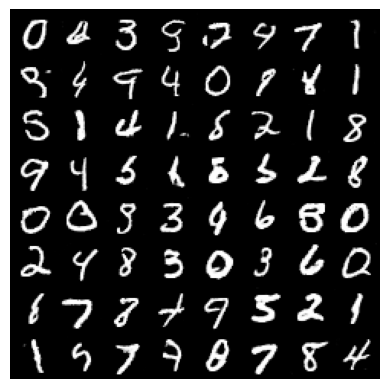

Epoch [91/100], Batch [100/938], D_real: 0.8038, D_fake: 0.0260, Loss_D: 0.2903, Loss_G: 4.6934
Epoch [91/100], Batch [200/938], D_real: 0.9925, D_fake: 0.1980, Loss_D: 0.3234, Loss_G: 4.4173
Epoch [91/100], Batch [300/938], D_real: 0.9753, D_fake: 0.1354, Loss_D: 0.2163, Loss_G: 3.2007
Epoch [91/100], Batch [400/938], D_real: 0.9578, D_fake: 0.0636, Loss_D: 0.1212, Loss_G: 4.8786
Epoch [91/100], Batch [500/938], D_real: 0.7797, D_fake: 0.0065, Loss_D: 0.3688, Loss_G: 5.9543
Epoch [91/100], Batch [600/938], D_real: 0.7805, D_fake: 0.0109, Loss_D: 0.3083, Loss_G: 5.5604
Epoch [91/100], Batch [700/938], D_real: 0.9311, D_fake: 0.0513, Loss_D: 0.1404, Loss_G: 5.5596
Epoch [91/100], Batch [800/938], D_real: 0.9892, D_fake: 0.1803, Loss_D: 0.3064, Loss_G: 5.5460
Epoch [91/100], Batch [900/938], D_real: 0.9122, D_fake: 0.0586, Loss_D: 0.1734, Loss_G: 3.5936


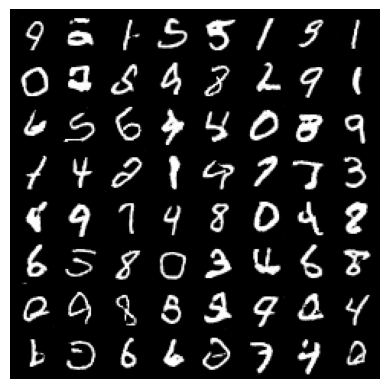

Epoch [92/100], Batch [100/938], D_real: 0.8873, D_fake: 0.0536, Loss_D: 0.2162, Loss_G: 4.6852
Epoch [92/100], Batch [200/938], D_real: 0.9921, D_fake: 0.0683, Loss_D: 0.0851, Loss_G: 4.0759
Epoch [92/100], Batch [300/938], D_real: 0.9933, D_fake: 0.1184, Loss_D: 0.1764, Loss_G: 4.1531
Epoch [92/100], Batch [400/938], D_real: 0.9489, D_fake: 0.0808, Loss_D: 0.1623, Loss_G: 4.3098
Epoch [92/100], Batch [500/938], D_real: 0.9758, D_fake: 0.0432, Loss_D: 0.0725, Loss_G: 5.2166
Epoch [92/100], Batch [600/938], D_real: 0.9519, D_fake: 0.1694, Loss_D: 0.3144, Loss_G: 2.6784
Epoch [92/100], Batch [700/938], D_real: 0.9235, D_fake: 0.0256, Loss_D: 0.1115, Loss_G: 5.3550
Epoch [92/100], Batch [800/938], D_real: 0.7976, D_fake: 0.0471, Loss_D: 0.3236, Loss_G: 3.4492
Epoch [92/100], Batch [900/938], D_real: 0.9555, D_fake: 0.2376, Loss_D: 0.4495, Loss_G: 4.6067


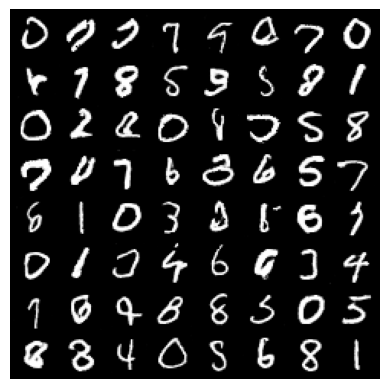

Epoch [93/100], Batch [100/938], D_real: 0.9899, D_fake: 0.0057, Loss_D: 0.0162, Loss_G: 7.1030
Epoch [93/100], Batch [200/938], D_real: 0.9835, D_fake: 0.1036, Loss_D: 0.1691, Loss_G: 4.8031
Epoch [93/100], Batch [300/938], D_real: 0.8934, D_fake: 0.0213, Loss_D: 0.1491, Loss_G: 5.1111
Epoch [93/100], Batch [400/938], D_real: 0.7619, D_fake: 0.0203, Loss_D: 0.3870, Loss_G: 4.9397
Epoch [93/100], Batch [500/938], D_real: 0.9843, D_fake: 0.1011, Loss_D: 0.1675, Loss_G: 4.0860
Epoch [93/100], Batch [600/938], D_real: 0.8993, D_fake: 0.0270, Loss_D: 0.1532, Loss_G: 5.8114
Epoch [93/100], Batch [700/938], D_real: 0.9166, D_fake: 0.0143, Loss_D: 0.1088, Loss_G: 5.2212
Epoch [93/100], Batch [800/938], D_real: 0.9673, D_fake: 0.0566, Loss_D: 0.1013, Loss_G: 4.6070
Epoch [93/100], Batch [900/938], D_real: 0.9700, D_fake: 0.0500, Loss_D: 0.0893, Loss_G: 4.5440


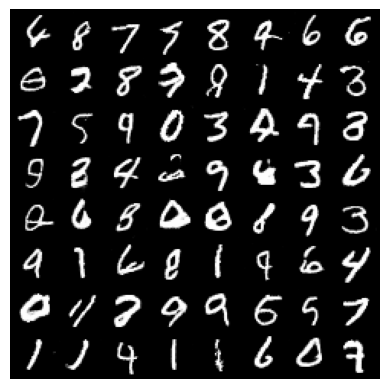

Epoch [94/100], Batch [100/938], D_real: 0.9273, D_fake: 0.0410, Loss_D: 0.1357, Loss_G: 5.2017
Epoch [94/100], Batch [200/938], D_real: 0.9631, D_fake: 0.0790, Loss_D: 0.1562, Loss_G: 4.2417
Epoch [94/100], Batch [300/938], D_real: 0.9938, D_fake: 0.0699, Loss_D: 0.0903, Loss_G: 4.3970
Epoch [94/100], Batch [400/938], D_real: 0.9889, D_fake: 0.2516, Loss_D: 0.4654, Loss_G: 3.2248
Epoch [94/100], Batch [500/938], D_real: 0.9163, D_fake: 0.0147, Loss_D: 0.1233, Loss_G: 5.1710
Epoch [94/100], Batch [600/938], D_real: 0.9717, D_fake: 0.1383, Loss_D: 0.2544, Loss_G: 4.3307
Epoch [94/100], Batch [700/938], D_real: 0.9697, D_fake: 0.0776, Loss_D: 0.1247, Loss_G: 3.5530
Epoch [94/100], Batch [800/938], D_real: 0.9683, D_fake: 0.0819, Loss_D: 0.1302, Loss_G: 4.5370
Epoch [94/100], Batch [900/938], D_real: 0.9178, D_fake: 0.0367, Loss_D: 0.1557, Loss_G: 4.3602


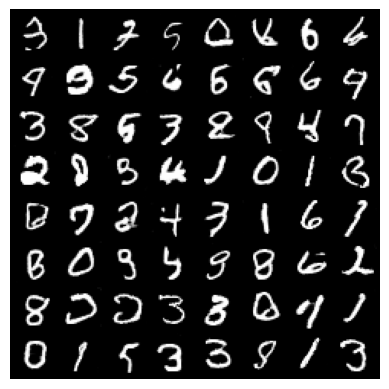

Epoch [95/100], Batch [100/938], D_real: 0.9558, D_fake: 0.0402, Loss_D: 0.0987, Loss_G: 4.7746
Epoch [95/100], Batch [200/938], D_real: 0.9863, D_fake: 0.1443, Loss_D: 0.2515, Loss_G: 3.1335
Epoch [95/100], Batch [300/938], D_real: 0.9641, D_fake: 0.0606, Loss_D: 0.1114, Loss_G: 4.7468
Epoch [95/100], Batch [400/938], D_real: 0.6915, D_fake: 0.0056, Loss_D: 0.4662, Loss_G: 7.2542
Epoch [95/100], Batch [500/938], D_real: 0.9332, D_fake: 0.0453, Loss_D: 0.1338, Loss_G: 5.3187
Epoch [95/100], Batch [600/938], D_real: 0.8343, D_fake: 0.0681, Loss_D: 0.2955, Loss_G: 5.3133
Epoch [95/100], Batch [700/938], D_real: 0.8781, D_fake: 0.0115, Loss_D: 0.1631, Loss_G: 6.5376
Epoch [95/100], Batch [800/938], D_real: 0.9435, D_fake: 0.0550, Loss_D: 0.1338, Loss_G: 4.8761
Epoch [95/100], Batch [900/938], D_real: 0.7652, D_fake: 0.0411, Loss_D: 0.3621, Loss_G: 3.5210


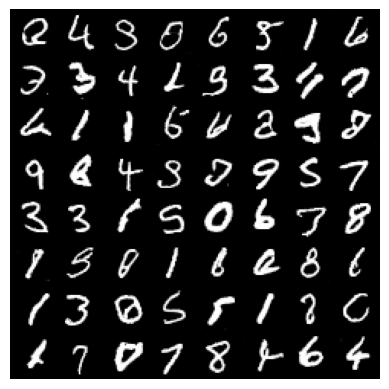

Epoch [96/100], Batch [100/938], D_real: 0.8536, D_fake: 0.0018, Loss_D: 0.2018, Loss_G: 7.3895
Epoch [96/100], Batch [200/938], D_real: 0.9924, D_fake: 0.2710, Loss_D: 0.4880, Loss_G: 4.0510
Epoch [96/100], Batch [300/938], D_real: 0.8382, D_fake: 0.0194, Loss_D: 0.2508, Loss_G: 6.7283
Epoch [96/100], Batch [400/938], D_real: 0.8910, D_fake: 0.0185, Loss_D: 0.1567, Loss_G: 6.3876
Epoch [96/100], Batch [500/938], D_real: 0.9449, D_fake: 0.0567, Loss_D: 0.1309, Loss_G: 5.4477
Epoch [96/100], Batch [600/938], D_real: 0.9819, D_fake: 0.2344, Loss_D: 0.4164, Loss_G: 4.6190
Epoch [96/100], Batch [700/938], D_real: 0.9615, D_fake: 0.0616, Loss_D: 0.1151, Loss_G: 5.1875
Epoch [96/100], Batch [800/938], D_real: 0.8954, D_fake: 0.0107, Loss_D: 0.1375, Loss_G: 6.2438
Epoch [96/100], Batch [900/938], D_real: 0.9958, D_fake: 0.1199, Loss_D: 0.1569, Loss_G: 4.0731


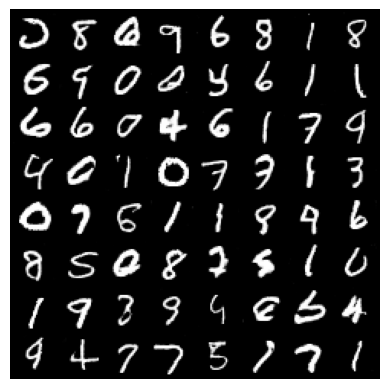

Epoch [97/100], Batch [100/938], D_real: 0.9943, D_fake: 0.2149, Loss_D: 0.3082, Loss_G: 3.5957
Epoch [97/100], Batch [200/938], D_real: 0.8560, D_fake: 0.0252, Loss_D: 0.2348, Loss_G: 4.8559
Epoch [97/100], Batch [300/938], D_real: 0.9456, D_fake: 0.0892, Loss_D: 0.1733, Loss_G: 4.4088
Epoch [97/100], Batch [400/938], D_real: 0.9522, D_fake: 0.0362, Loss_D: 0.0921, Loss_G: 4.8616
Epoch [97/100], Batch [500/938], D_real: 0.8171, D_fake: 0.0090, Loss_D: 0.2647, Loss_G: 4.6190
Epoch [97/100], Batch [600/938], D_real: 0.9902, D_fake: 0.1012, Loss_D: 0.1514, Loss_G: 3.8538
Epoch [97/100], Batch [700/938], D_real: 0.9073, D_fake: 0.0446, Loss_D: 0.1715, Loss_G: 5.7371
Epoch [97/100], Batch [800/938], D_real: 0.8040, D_fake: 0.0354, Loss_D: 0.3143, Loss_G: 6.6154
Epoch [97/100], Batch [900/938], D_real: 0.9597, D_fake: 0.2009, Loss_D: 0.3339, Loss_G: 4.1052


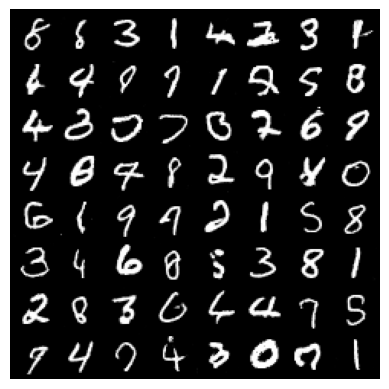

Epoch [98/100], Batch [100/938], D_real: 0.9705, D_fake: 0.1024, Loss_D: 0.1639, Loss_G: 4.7668
Epoch [98/100], Batch [200/938], D_real: 0.9880, D_fake: 0.1400, Loss_D: 0.2072, Loss_G: 2.6123
Epoch [98/100], Batch [300/938], D_real: 0.9154, D_fake: 0.0925, Loss_D: 0.2374, Loss_G: 4.9132
Epoch [98/100], Batch [400/938], D_real: 0.8094, D_fake: 0.0168, Loss_D: 0.2925, Loss_G: 4.9884
Epoch [98/100], Batch [500/938], D_real: 0.9764, D_fake: 0.0397, Loss_D: 0.0702, Loss_G: 4.9271
Epoch [98/100], Batch [600/938], D_real: 0.8280, D_fake: 0.0112, Loss_D: 0.2786, Loss_G: 6.3663
Epoch [98/100], Batch [700/938], D_real: 0.9427, D_fake: 0.0088, Loss_D: 0.0734, Loss_G: 5.3959
Epoch [98/100], Batch [800/938], D_real: 0.9828, D_fake: 0.1202, Loss_D: 0.1697, Loss_G: 3.8738
Epoch [98/100], Batch [900/938], D_real: 0.9307, D_fake: 0.0431, Loss_D: 0.1288, Loss_G: 5.1284


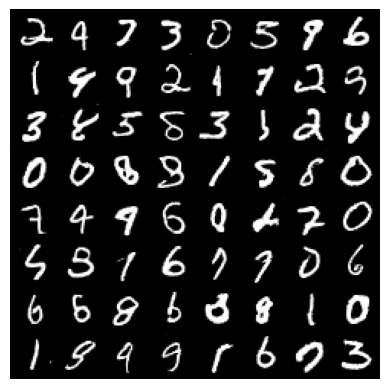

Epoch [99/100], Batch [100/938], D_real: 0.8127, D_fake: 0.0294, Loss_D: 0.3144, Loss_G: 4.3913
Epoch [99/100], Batch [200/938], D_real: 0.9343, D_fake: 0.0091, Loss_D: 0.0841, Loss_G: 5.7122
Epoch [99/100], Batch [300/938], D_real: 0.9416, D_fake: 0.0107, Loss_D: 0.0768, Loss_G: 7.2335
Epoch [99/100], Batch [400/938], D_real: 0.8473, D_fake: 0.0179, Loss_D: 0.2132, Loss_G: 5.5169
Epoch [99/100], Batch [500/938], D_real: 0.9273, D_fake: 0.0613, Loss_D: 0.1616, Loss_G: 4.5336
Epoch [99/100], Batch [600/938], D_real: 0.7863, D_fake: 0.0367, Loss_D: 0.3694, Loss_G: 4.9266
Epoch [99/100], Batch [700/938], D_real: 0.8137, D_fake: 0.0102, Loss_D: 0.2636, Loss_G: 5.1171
Epoch [99/100], Batch [800/938], D_real: 0.9669, D_fake: 0.0131, Loss_D: 0.0492, Loss_G: 5.8777
Epoch [99/100], Batch [900/938], D_real: 0.9594, D_fake: 0.0491, Loss_D: 0.1056, Loss_G: 6.0466


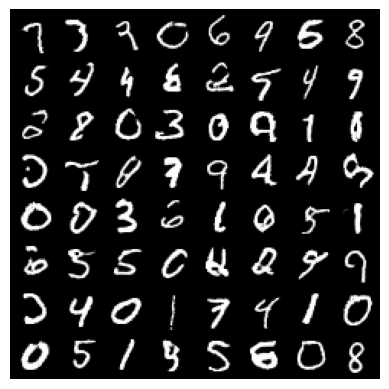

Epoch [100/100], Batch [100/938], D_real: 0.8977, D_fake: 0.0412, Loss_D: 0.1958, Loss_G: 5.5658
Epoch [100/100], Batch [200/938], D_real: 0.8025, D_fake: 0.0211, Loss_D: 0.2846, Loss_G: 4.7688
Epoch [100/100], Batch [300/938], D_real: 0.9464, D_fake: 0.0192, Loss_D: 0.0829, Loss_G: 5.8960
Epoch [100/100], Batch [400/938], D_real: 0.9937, D_fake: 0.0911, Loss_D: 0.1143, Loss_G: 4.0494
Epoch [100/100], Batch [500/938], D_real: 0.9960, D_fake: 0.2284, Loss_D: 0.3868, Loss_G: 3.4820
Epoch [100/100], Batch [600/938], D_real: 0.9166, D_fake: 0.0316, Loss_D: 0.1464, Loss_G: 5.5249
Epoch [100/100], Batch [700/938], D_real: 0.9686, D_fake: 0.0686, Loss_D: 0.1354, Loss_G: 3.4775
Epoch [100/100], Batch [800/938], D_real: 0.9931, D_fake: 0.0660, Loss_D: 0.0828, Loss_G: 4.5164
Epoch [100/100], Batch [900/938], D_real: 0.8565, D_fake: 0.0698, Loss_D: 0.2737, Loss_G: 3.8521


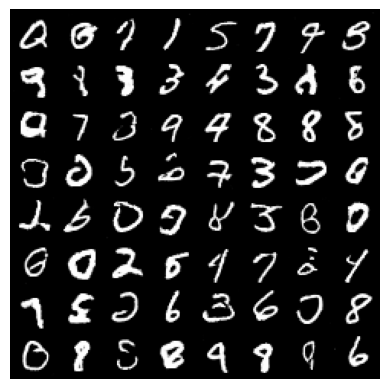

Epoch [1/100], Batch [700/938], D_real: 0.5207, D_fake: 0.5632, Loss_D: 1.5047, Loss_G: 0.5857
Epoch [1/100], Batch [800/938], D_real: 0.5056, D_fake: 0.5508, Loss_D: 1.4992, Loss_G: 0.6052
Epoch [1/100], Batch [900/938], D_real: 0.5049, D_fake: 0.5641, Loss_D: 1.5381, Loss_G: 0.5825


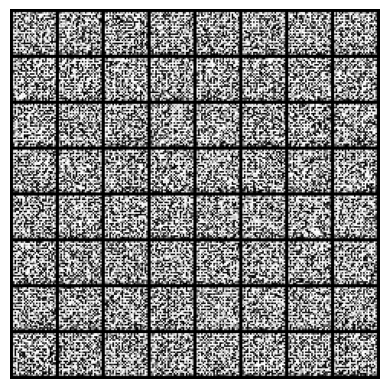

Epoch [2/100], Batch [100/938], D_real: 0.5137, D_fake: 0.5729, Loss_D: 1.5391, Loss_G: 0.5673
Epoch [2/100], Batch [200/938], D_real: 0.5054, D_fake: 0.5528, Loss_D: 1.5177, Loss_G: 0.6093
Epoch [2/100], Batch [300/938], D_real: 0.5086, D_fake: 0.5581, Loss_D: 1.5151, Loss_G: 0.5944
Epoch [2/100], Batch [400/938], D_real: 0.5062, D_fake: 0.5572, Loss_D: 1.5182, Loss_G: 0.5962
Epoch [2/100], Batch [500/938], D_real: 0.5085, D_fake: 0.5616, Loss_D: 1.5220, Loss_G: 0.5867
Epoch [2/100], Batch [600/938], D_real: 0.5085, D_fake: 0.5650, Loss_D: 1.5335, Loss_G: 0.5814
Epoch [2/100], Batch [700/938], D_real: 0.5082, D_fake: 0.5879, Loss_D: 1.5871, Loss_G: 0.5397
Epoch [2/100], Batch [800/938], D_real: 0.5173, D_fake: 0.5578, Loss_D: 1.4995, Loss_G: 0.5953
Epoch [2/100], Batch [900/938], D_real: 0.5108, D_fake: 0.5557, Loss_D: 1.5069, Loss_G: 0.6013


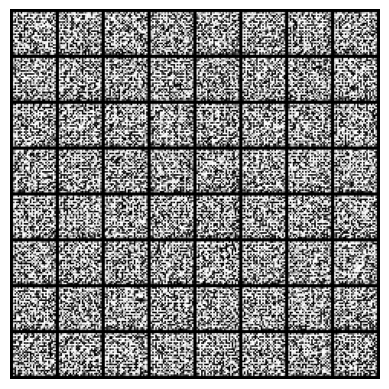

Epoch [3/100], Batch [100/938], D_real: 0.5064, D_fake: 0.5742, Loss_D: 1.5565, Loss_G: 0.5640


KeyboardInterrupt: 

In [13]:
# Training loop
for epoch in range(num_epochs):
    for i, (real_images, _) in enumerate(data_loader):
        real_images = real_images.cuda()
        batch_size = real_images.size(0)

        # Train discriminator with real images
        optimizer_d.zero_grad()
        label_real = torch.ones(batch_size, 1).cuda()
        output_real = discriminator(real_images).view(-1, 1)
        loss_real = criterion(output_real, label_real)
        loss_real.backward()

        # Train discriminator with fake images
        noise = torch.randn(batch_size, latent_dim, 1, 1).cuda()
        fake_images = generator(noise)
        label_fake = torch.zeros(batch_size, 1).cuda()
        output_fake = discriminator(fake_images.detach()).view(-1, 1)
        loss_fake = criterion(output_fake, label_fake)
        loss_fake.backward()
        optimizer_d.step()

        # Train generator
        optimizer_g.zero_grad()
        output = discriminator(fake_images).view(-1, 1)
        loss_g = criterion(output, label_real)
        loss_g.backward()
        optimizer_g.step()

        if (i + 1) % 100 == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Batch [{i+1}/{len(data_loader)}], '
                  f'D_real: {output_real.mean():.4f}, D_fake: {output_fake.mean():.4f}, '
                  f'Loss_D: {loss_real.item() + loss_fake.item():.4f}, Loss_G: {loss_g.item():.4f}')
            # Generate and save sample images at the end of each epoch
    with torch.no_grad():
        fake_samples = generator(torch.randn(64, latent_dim, 1, 1).cuda())
        fake_samples = fake_samples.cpu()
        fake_grid = torchvision.utils.make_grid(fake_samples, padding=2, normalize=True)
        plt.imshow(np.transpose(fake_grid, (1, 2, 0)))
        plt.axis('off')
        plt.show()

In [ ]:
# Save the trained generator model
torch.save(generator.state_dict(), 'generator.pth')